In [30]:
import pandas as pd
import matplotlib.pyplot as plt
# %matplotlib inline 
%matplotlib notebook
import numpy as np
import ast
from pandas.stats.api import ols
import os
import statsmodels.api as sm
from statsmodels.formula.api import ols as ols2

In [31]:
files = []
datapath = './'
for i in os.listdir(datapath):
    if 'processed2' in i:
        files.append(i)

In [32]:
len(files)

33

test code

In [41]:
df = pd.read_csv(datapath + files[0], sep = '\t')
df = df.apply(lambda x: pd.to_numeric(x, errors='ignore'))

In [65]:
df.columns.values

array(['AdditionalTags', 'ArchiveWarnings', 'Author', 'Bookmarks',
       'Category', 'Chapters', 'Characters', 'Fandoms', 'Hits', 'Kudos',
       'Rating', 'Relationship', 'Title', 'UpdateDate', 'Words',
       'Comments', 'CompleteDate', 'PublishDate', 'KL'], dtype=object)

In [48]:
df = df.drop(df.index[[0, 1]])
for i in ['Kudos', 'Chapters', 'CompleteDate', 'PublishDate', 'Words', 'KL']:
    df[i] = (df[i].astype(float) - df[i].astype(float).mean())/df[i].astype(float).std(ddof=0)

In [58]:
df.head()

,AdditionalTags,ArchiveWarnings,Author,Bookmarks,Category,Chapters,Characters,Fandoms,Hits,Kudos,Rating,Relationship,Title,UpdateDate,Words,Comments,CompleteDate,PublishDate,KL
2,0,Creator Chose Not To Use Archive Warnings,101AnimeDeXMenMcFassyFreak,0.0,M/M,-0.240707,"Michael Fassbender, James McAvoy","['British Actor RPF', 'X-Men - All Media Types...",166.0,-0.499389,Not Rated,Michael Fassbender/James McAvoy,Rapunzel,0,-0.334925,0,-0.824040,-0.229954,-0.458753
3,0,Creator Chose Not To Use Archive Warnings,24_centuries,0.0,M/M,-0.240707,"Chris Pine, Zachary Quinto, Karl Urban",['Star Trek RPF'],755.0,-0.350587,Mature,"Chris Pine/Karl Urban, Chris Pine/Zachary Quinto",Tangible,0,-0.363342,2,-0.434078,-0.132171,1.554803
4,0,Creator Chose Not To Use Archive Warnings,2Loverz,4.0,M/M,-0.240707,"Bruce Greenwood, Chris Pine",['Star Trek RPF'],177.0,-0.424988,Explicit,Bruce Greenwood/Chris Pine,The Inevitable,0,-0.305385,4,-0.363001,-0.114348,-0.338194
5,0,Creator Chose Not To Use Archive Warnings,3917laura,4.0,F/M,1.606532,"Oswald Cobblepot, Jim Gordon, Fish Mooney, Har...","['Gotham (TV)', 'Gotham (TV) RPF']",562.0,-0.254929,Teen And Up Audiences,Oswald Cobblepot/Original Character(s),The Broken Umbrella: The Rise Of Oswald Cobblepot,2016-05-10,1.880399,5,-1.121795,-0.274993,-0.077274
6,0,Creator Chose Not To Use Archive Warnings,69inthe67impala,0.0,Multi,0.095154,"Jensen Ackles, Jared Padalecki, Genevieve Pada...","['Supernatural', 'J2 - Fandom']",452.0,-0.446245,General Audiences,Jensen Ackles/Jared Padalecki,Slowhand,2014-02-19,-0.220195,2,-1.121795,-0.094839,-0.012235


run on all datasets

In [59]:
def regression(fn):
    df = pd.read_csv(datapath + fn, sep = '\t')
    df = df.drop(df.index[[0, 1]])
    df = df.apply(lambda x: pd.to_numeric(x, errors='ignore'))
    for i in ['Kudos', 'Chapters', 'CompleteDate', 'PublishDate', 'Words', 'KL']:
        df[i] = (df[i].astype(float) - df[i].astype(float).mean())/df[i].astype(float).std(ddof=0)
    res = ols(y = df['Kudos'].astype(float), x = df[['Chapters','CompleteDate','PublishDate', 'Words', 'KL']])
    print 'regression for: ', fn
    print res

In [51]:
for i in files:
    regression(i)

regression for:  actor_rpf_processed2.tsv

-------------------------Summary of Regression Analysis-------------------------

Formula: Y ~ <Chapters> + <CompleteDate> + <PublishDate> + <Words> + <KL>
             + <intercept>

Number of Observations:         33244
Number of Degrees of Freedom:   6

R-squared:         0.1325
Adj R-squared:     0.1323

Rmse:              0.9315

F-stat (5, 33238):  1015.1552, p-value:     0.0000

Degrees of Freedom: model 5, resid 33238

-----------------------Summary of Estimated Coefficients------------------------
      Variable       Coef    Std Err     t-stat    p-value    CI 2.5%   CI 97.5%
--------------------------------------------------------------------------------
      Chapters    -0.0199     0.0071      -2.80     0.0051    -0.0339    -0.0060
  CompleteDate    -0.1243     0.0054     -23.13     0.0000    -0.1349    -0.1138
   PublishDate    -0.0157     0.0053      -2.97     0.0029    -0.0260    -0.0053
         Words     0.3288     0.0072    

/Users/jingy/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:2: FutureWarning: The pandas.stats.ols module is deprecated and will be removed in a future version. We refer to external packages like statsmodels, see some examples here: http://statsmodels.sourceforge.net/stable/regression.html
  from IPython.kernel.zmq import kernelapp as app


In [60]:
def plot_partial_regression2(fn):
    df = pd.read_csv(datapath + fn, sep = '\t')
    df = df.drop(df.index[[0, 1]])
    df = df.apply(lambda x: pd.to_numeric(x, errors='ignore'))
    for i in ['Kudos', 'Chapters', 'CompleteDate', 'PublishDate', 'Words', 'KL']:
        df[i] = (df[i].astype(float) - df[i].astype(float).mean())/df[i].astype(float).std(ddof=0)
    m = ols2("Kudos ~ Chapters + CompleteDate + PublishDate + Words + KL", data = df).fit()
    print 'regression for: ', fn.split('.')[0], '， with # of works: ', len(df)
    fig = plt.figure(figsize = (10, 10))
    fig = sm.graphics.plot_partregress_grid(m, fig=fig)

In [61]:
def plot_CCPR_regression2(fn):
    df = pd.read_csv(datapath + fn, sep = '\t')
    df = df.drop(df.index[[0, 1]])
    df = df.apply(lambda x: pd.to_numeric(x, errors='ignore'))
    for i in ['Kudos', 'Chapters', 'CompleteDate', 'PublishDate', 'Words', 'KL']:
        df[i] = (df[i].astype(float) - df[i].astype(float).mean())/df[i].astype(float).std(ddof=0)
    m = ols2("Kudos ~ Chapters + CompleteDate + PublishDate + Words + KL", data = df).fit()
    print 'regression for: ', fn.split('.')[0], '， with # of works: ', len(df)
    fig = plt.figure(figsize = (10, 10))
    fig = sm.graphics.plot_ccpr_grid(m, fig=fig)

regression for:  actor_rpf_processed2 ， with # of works:  33244


<IPython.core.display.Javascript object>


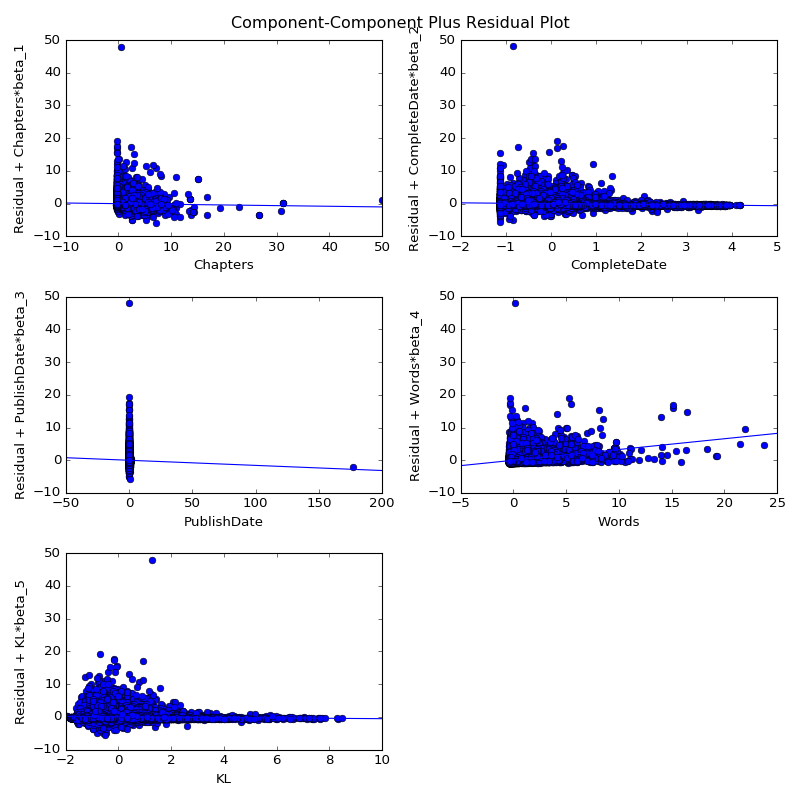

regression for:  arthurian_mythology_&_related_fandoms_processed2 ， with # of works:  22589


<IPython.core.display.Javascript object>


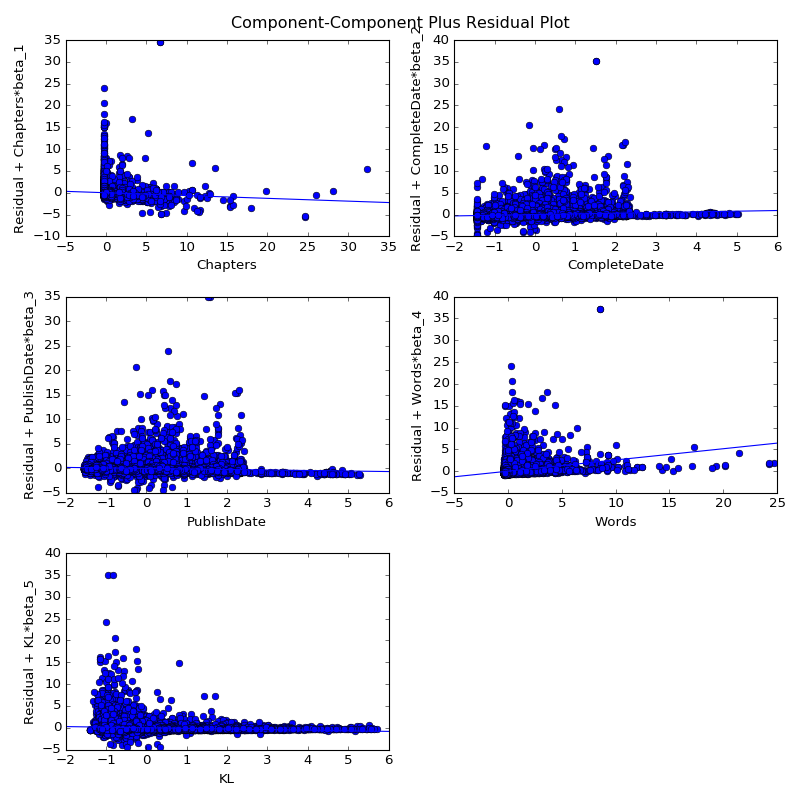

regression for:  attack_on_titan_processed2 ， with # of works:  25255


<IPython.core.display.Javascript object>


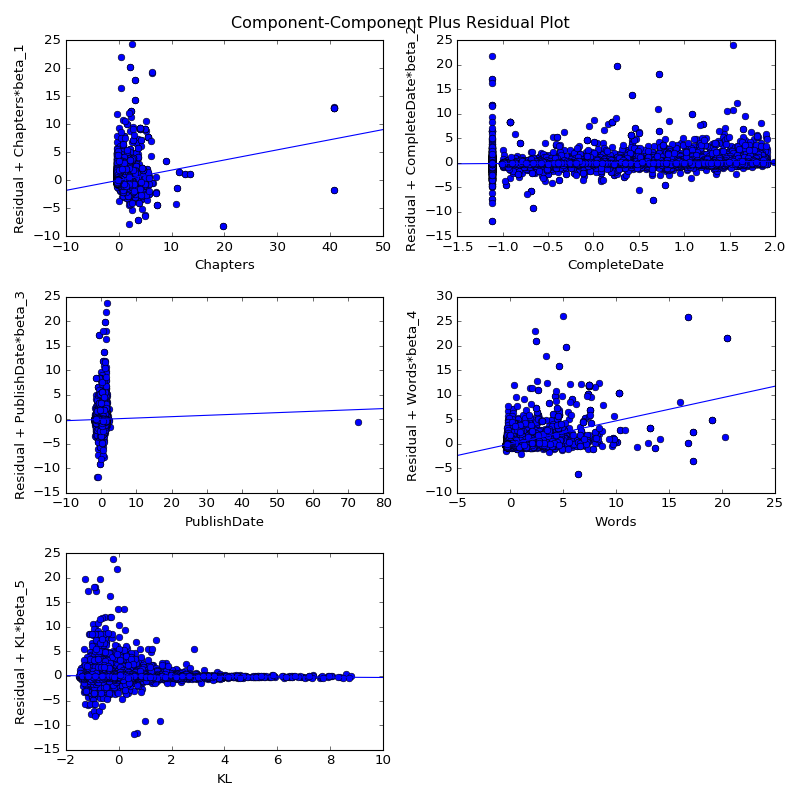

regression for:  bandom_processed2 ， with # of works:  24771


<IPython.core.display.Javascript object>


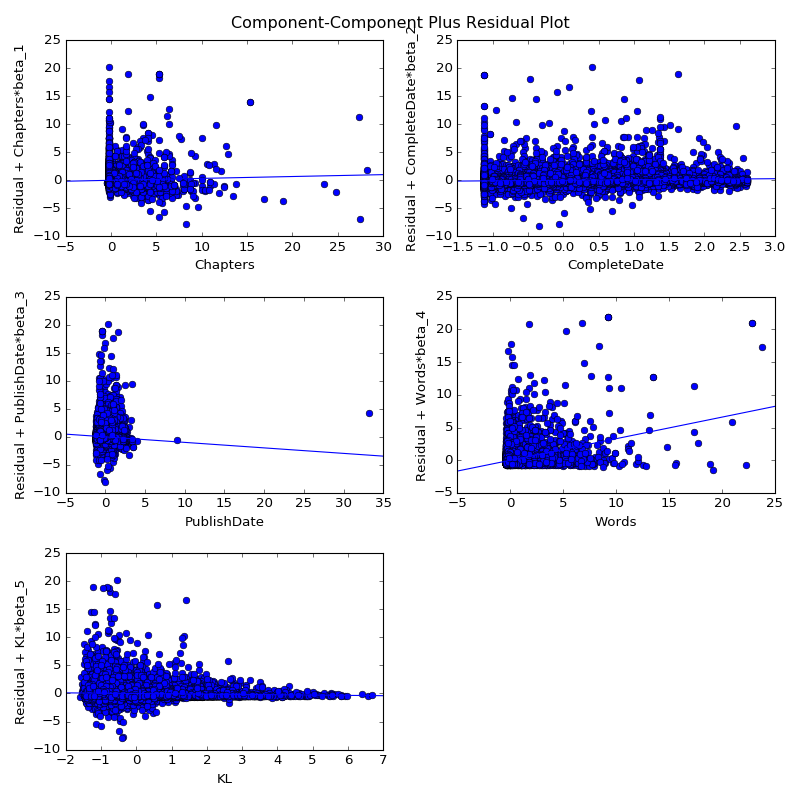

regression for:  bishoujo_senshi_sailor_moon_processed2 ， with # of works:  1992


<IPython.core.display.Javascript object>


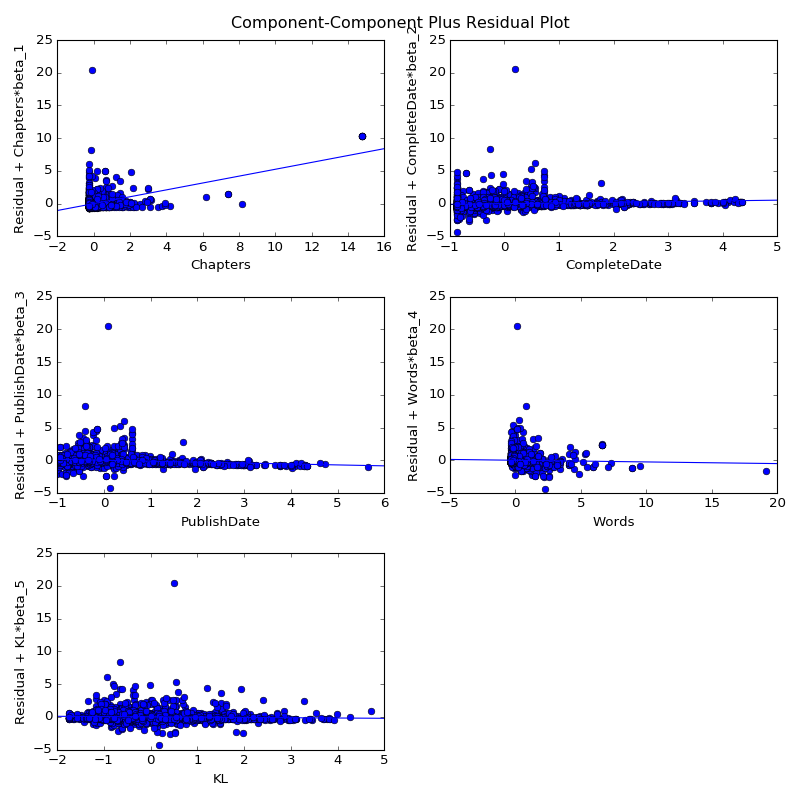

regression for:  buffy_the_vampire_slayer_processed2 ， with # of works:  20809


<IPython.core.display.Javascript object>


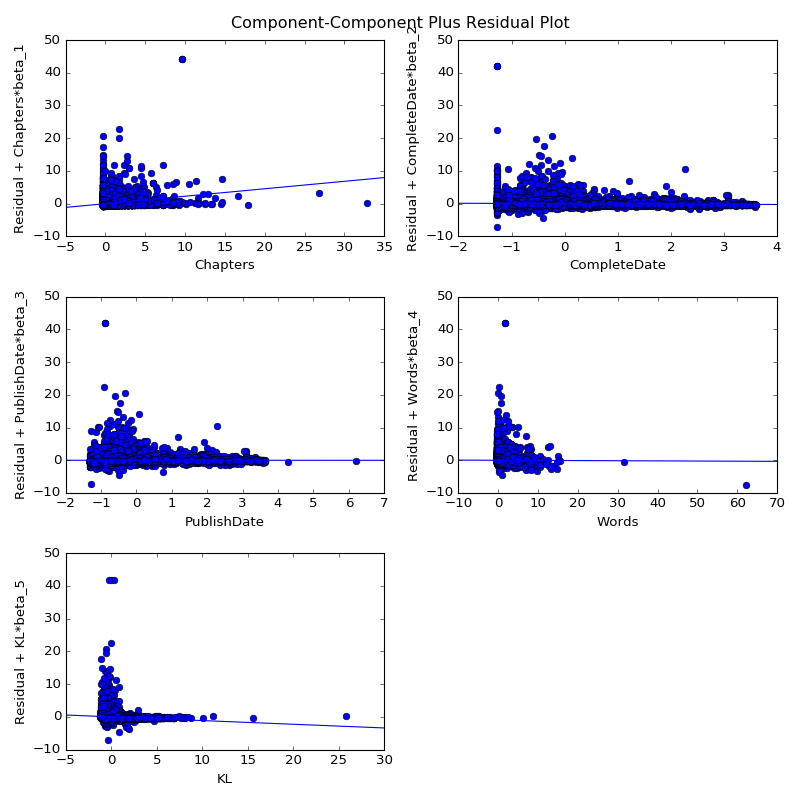

regression for:  dcu_processed2 ， with # of works:  45935


<IPython.core.display.Javascript object>


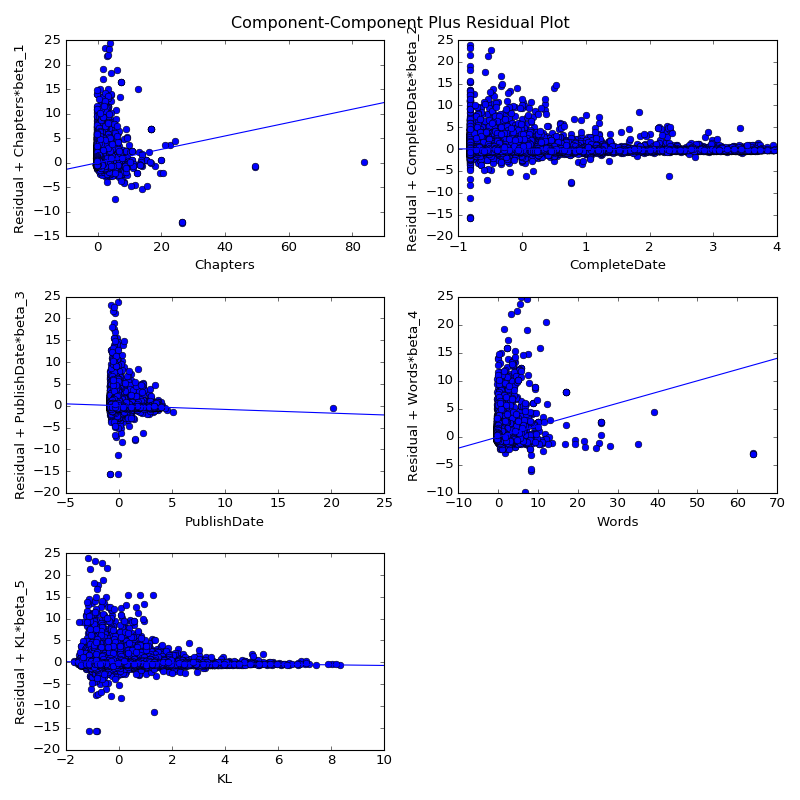

regression for:  doctor_who_&_related_fandoms_processed2 ， with # of works:  42356


<IPython.core.display.Javascript object>


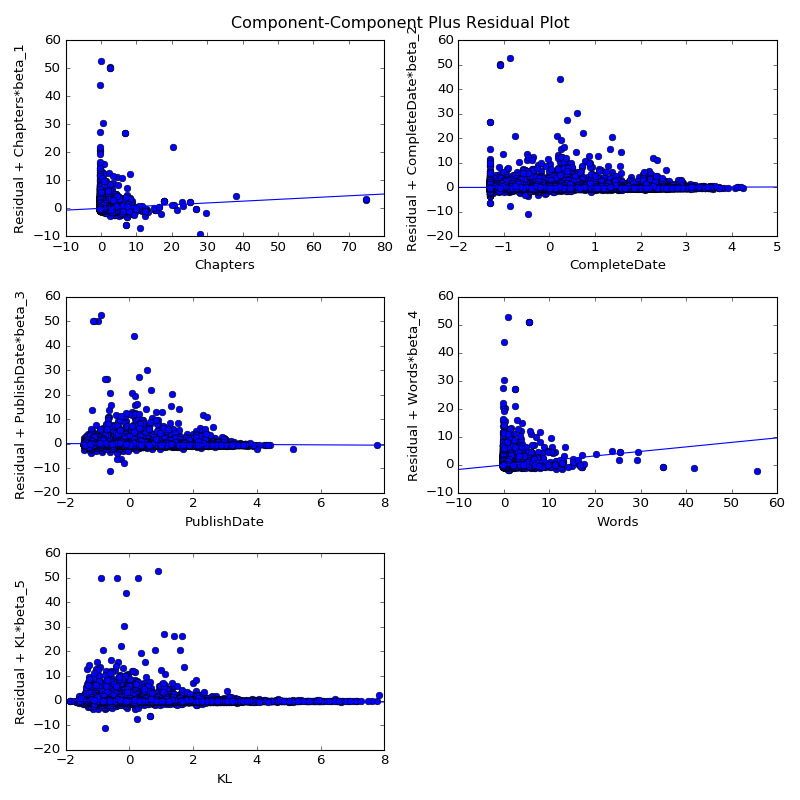

regression for:  doctor_who_processed2 ， with # of works:  33458


<IPython.core.display.Javascript object>


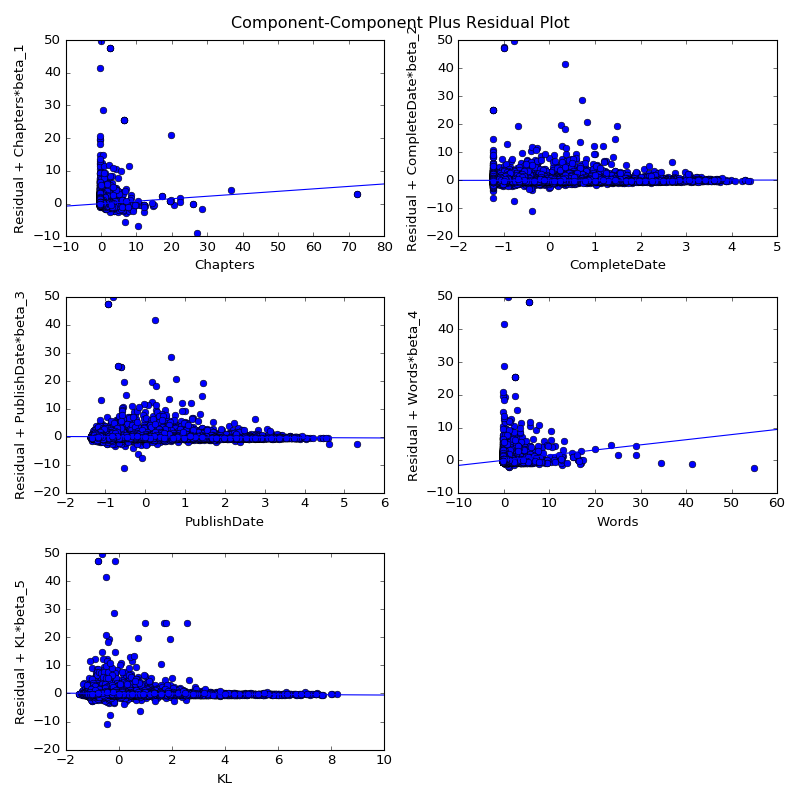

regression for:  dragon_age_all_media_types_processed2 ， with # of works:  34268


<IPython.core.display.Javascript object>


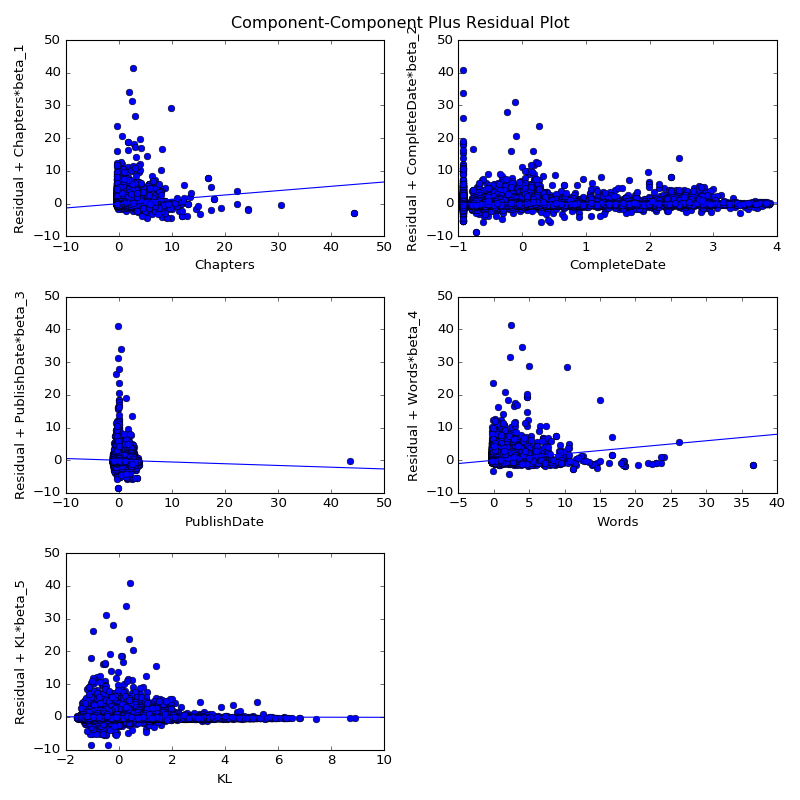

regression for:  dragon_age_inquisition_processed2 ， with # of works:  17954


<IPython.core.display.Javascript object>


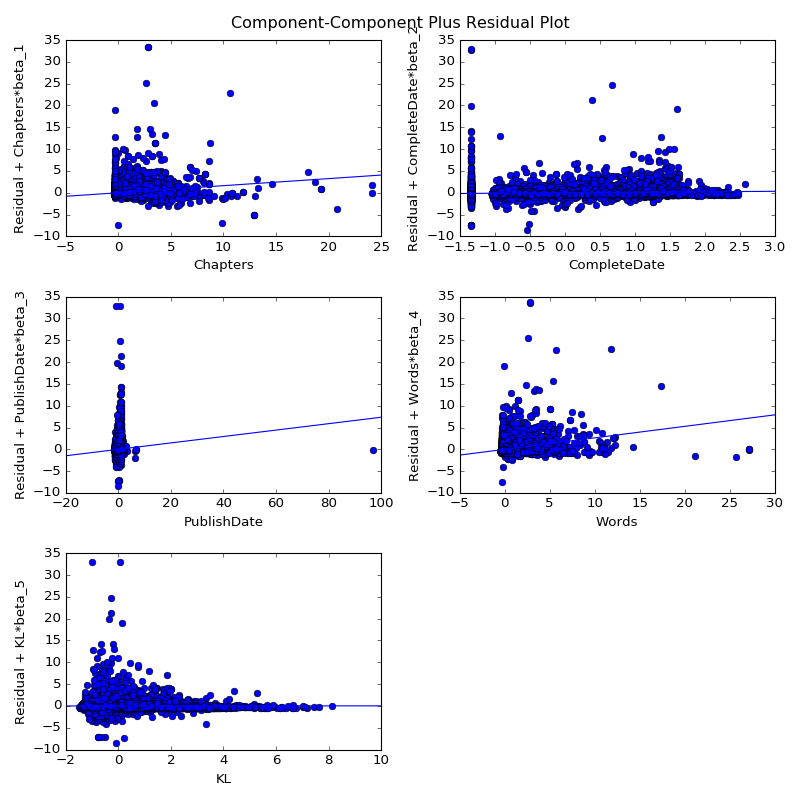

regression for:  dragon_age_video_games_processed2 ， with # of works:  29774


<IPython.core.display.Javascript object>


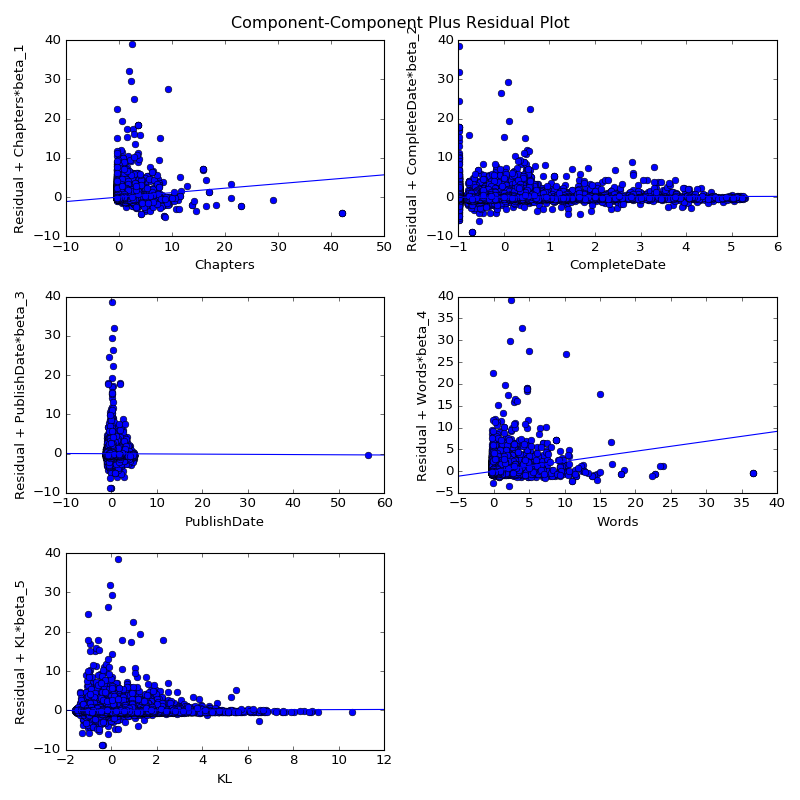

regression for:  haikyuu_processed2 ， with # of works:  18712


<IPython.core.display.Javascript object>


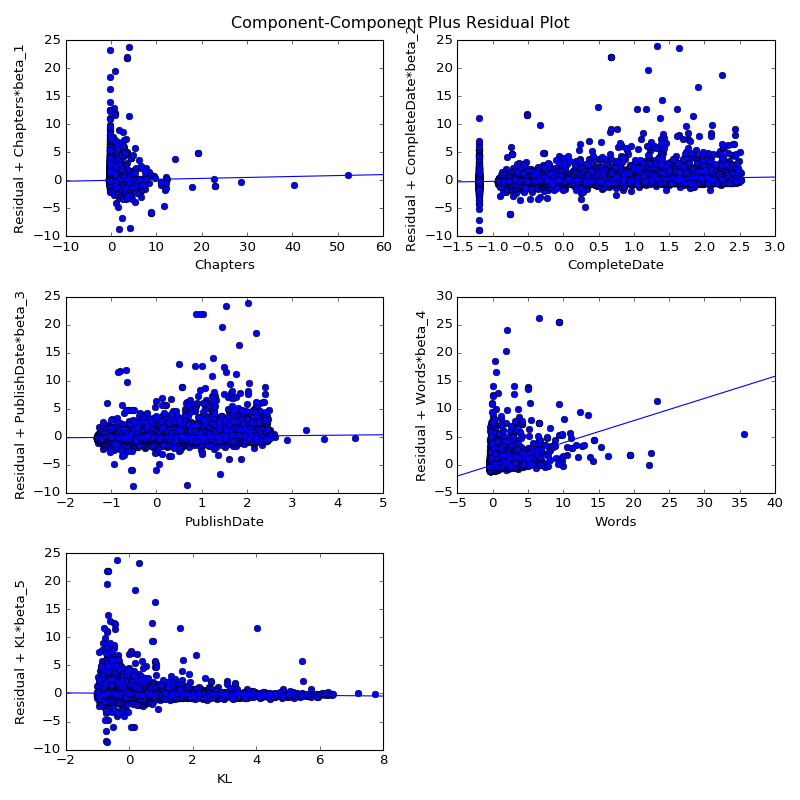

regression for:  hamilton_miranda_processed2 ， with # of works:  2837


<IPython.core.display.Javascript object>


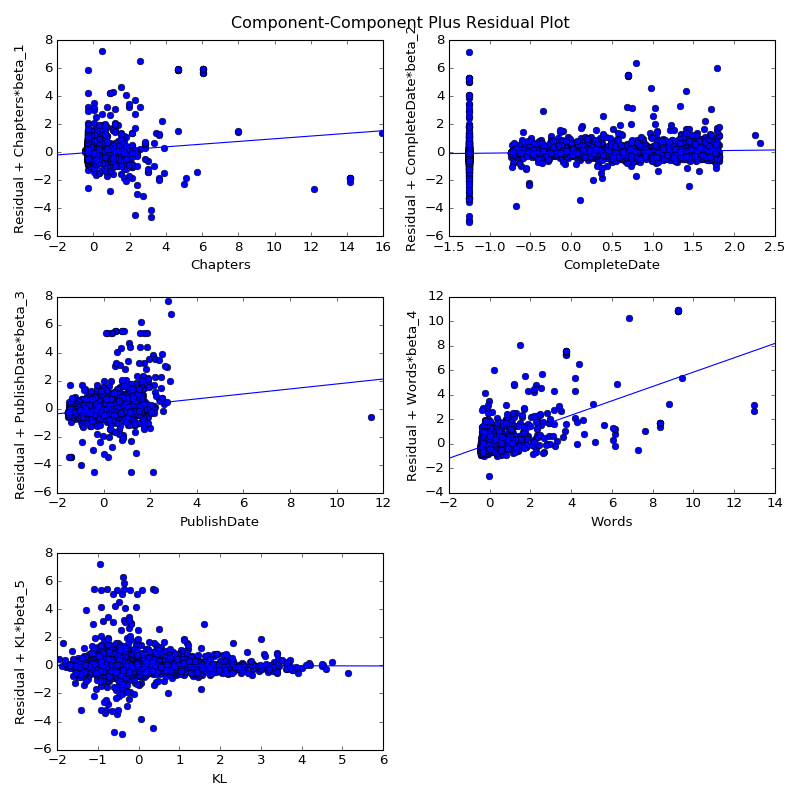

regression for:  hetalia_axis_powers_processed2 ， with # of works:  16373


<IPython.core.display.Javascript object>


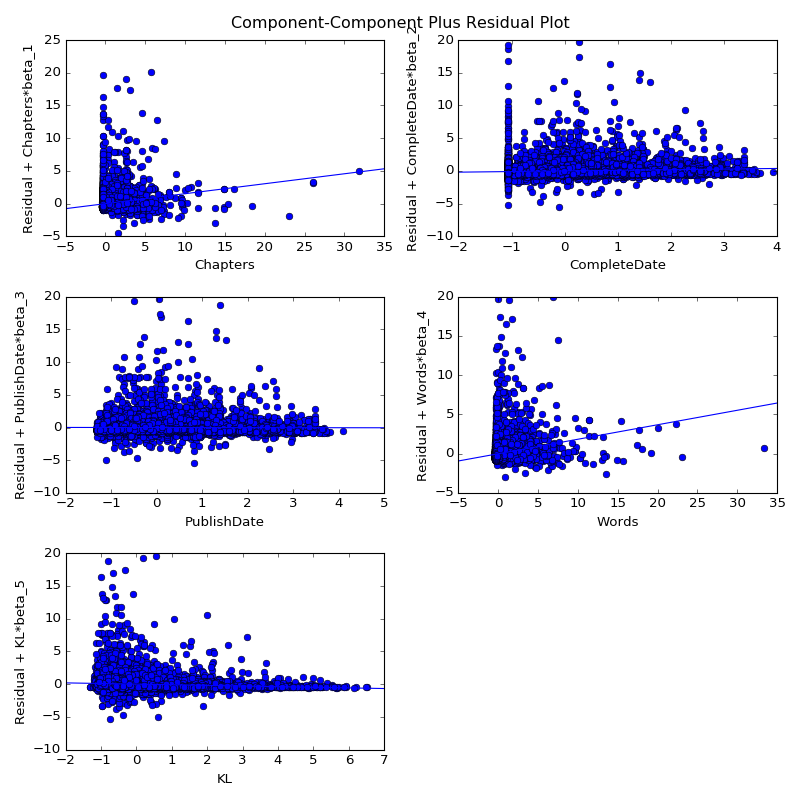

regression for:  homestuck_processed2 ， with # of works:  36649


<IPython.core.display.Javascript object>


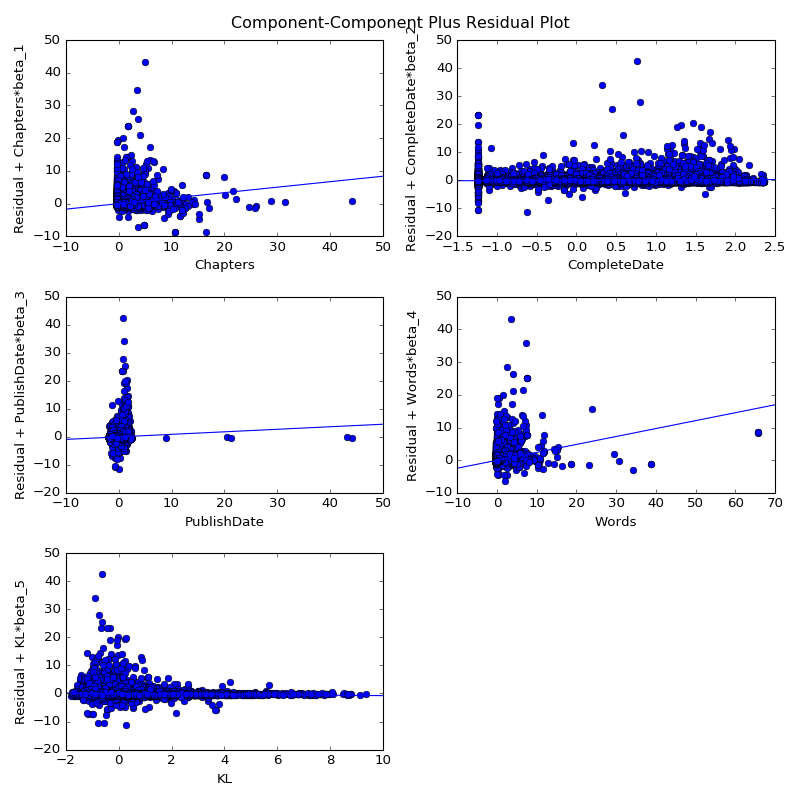

regression for:  internet_personalities_processed2 ， with # of works:  26581


<IPython.core.display.Javascript object>


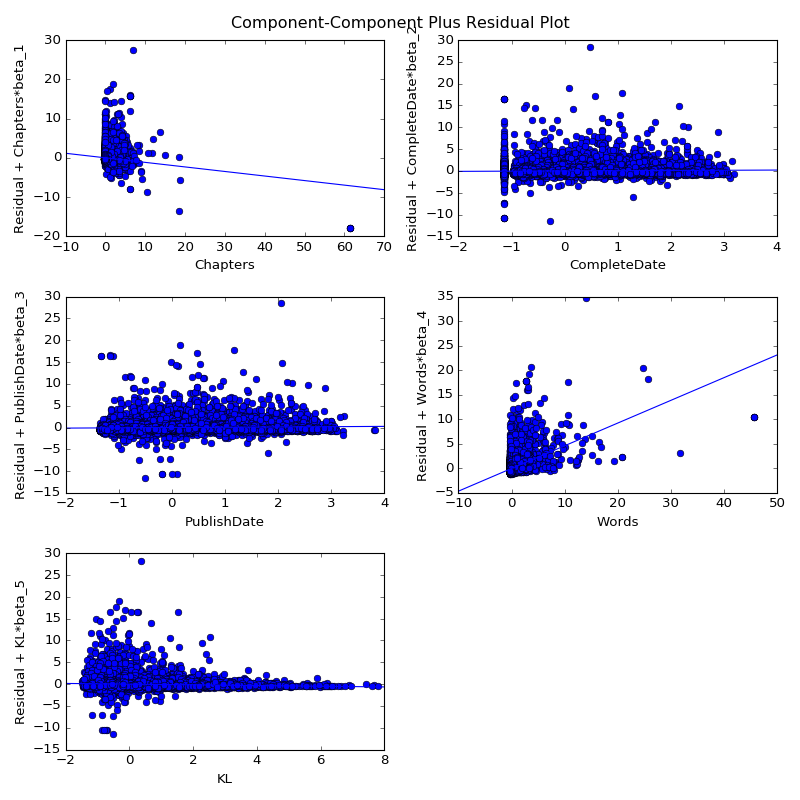

regression for:  k_pop_processed2 ， with # of works:  27353


<IPython.core.display.Javascript object>


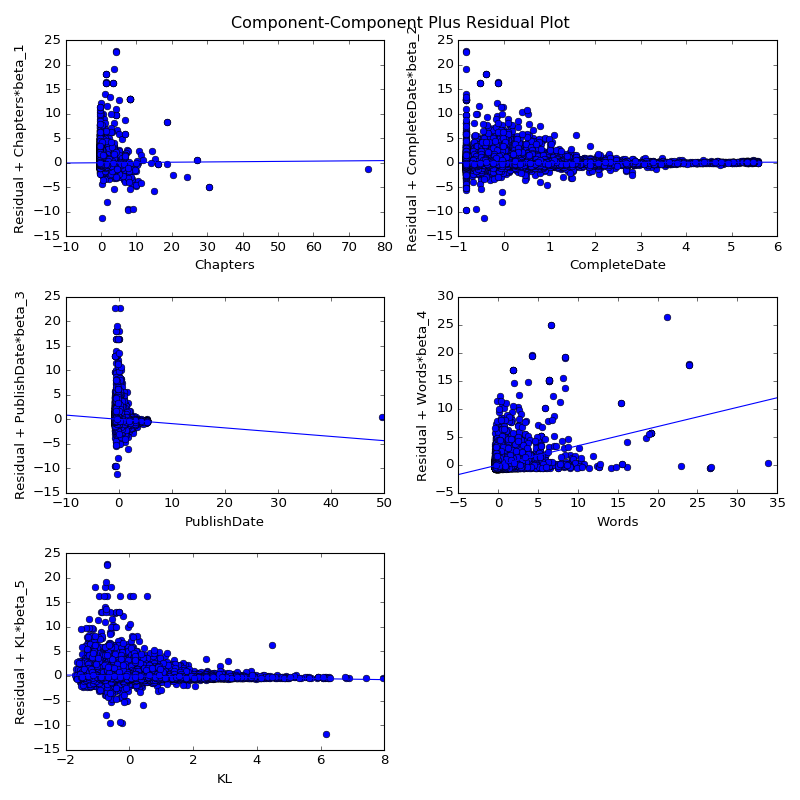

regression for:  kuroko_no_basuke_processed2 ， with # of works:  10679


<IPython.core.display.Javascript object>


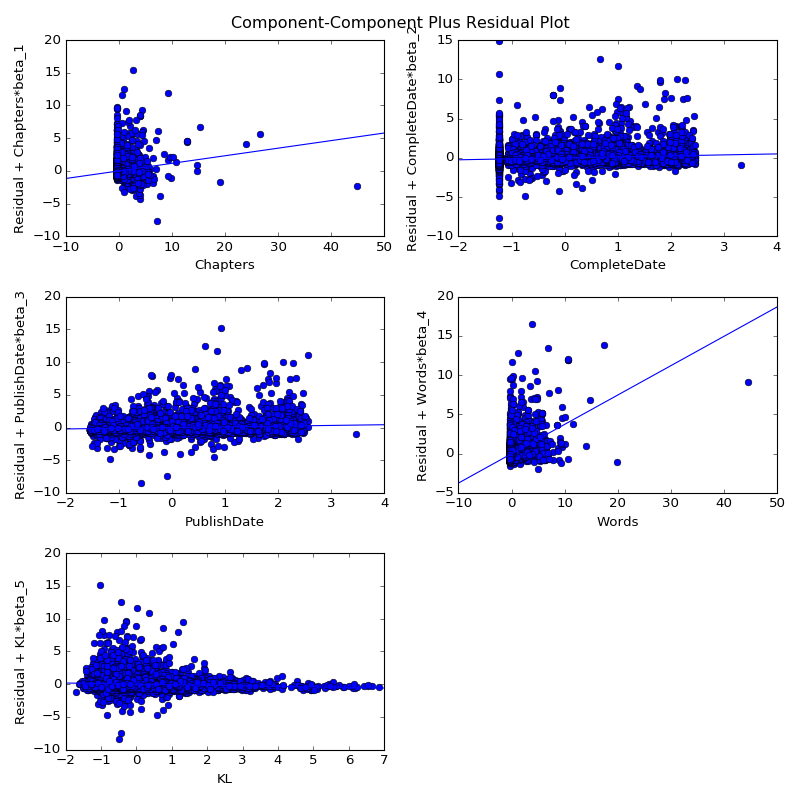

regression for:  les_miserables_all_media_types_processed2 ， with # of works:  13346


<IPython.core.display.Javascript object>


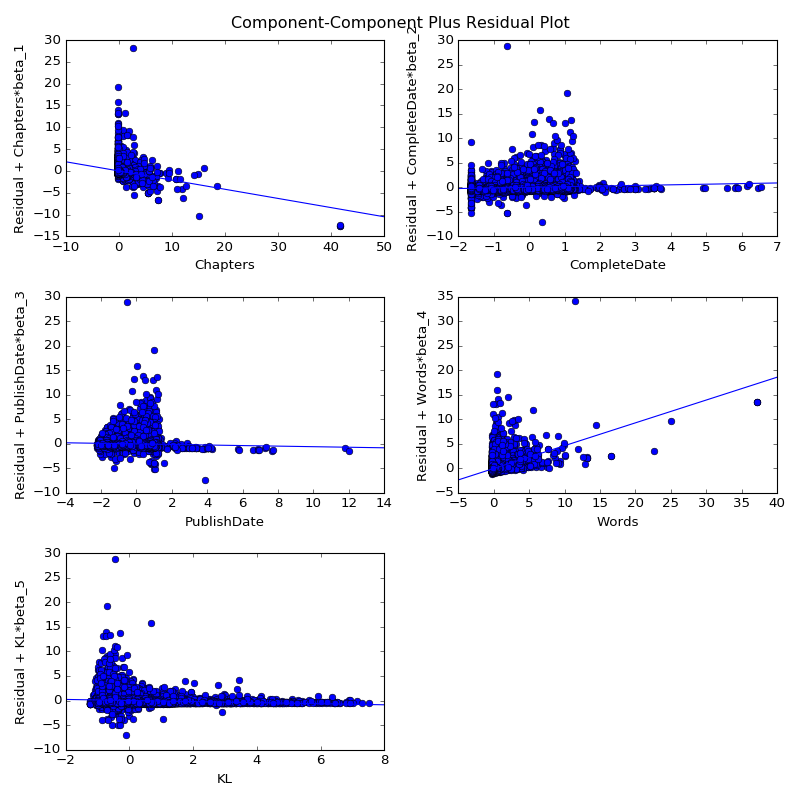

regression for:  les_miserables_schonberg_boublil_processed2 ， with # of works:  2059


<IPython.core.display.Javascript object>


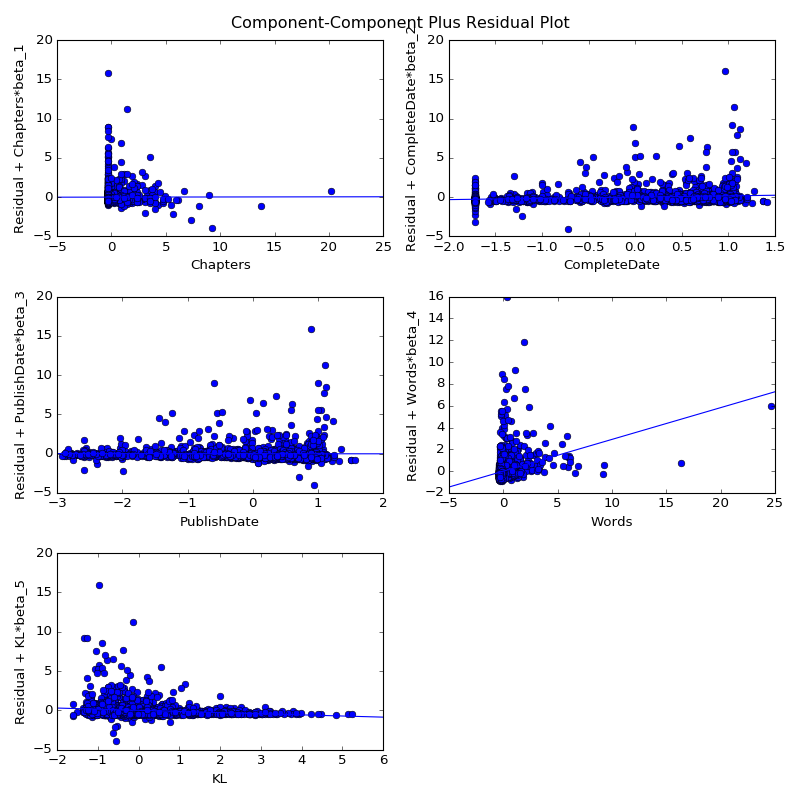

regression for:  ms_paint_adventures_processed2 ， with # of works:  33414


<IPython.core.display.Javascript object>


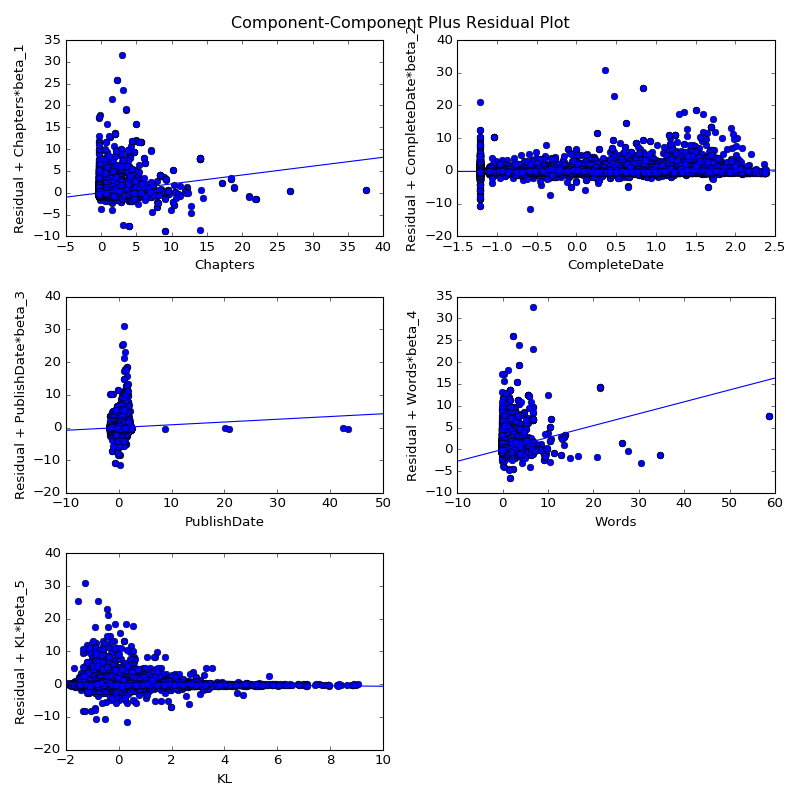

regression for:  music_rpf_processed2 ， with # of works:  24106


<IPython.core.display.Javascript object>


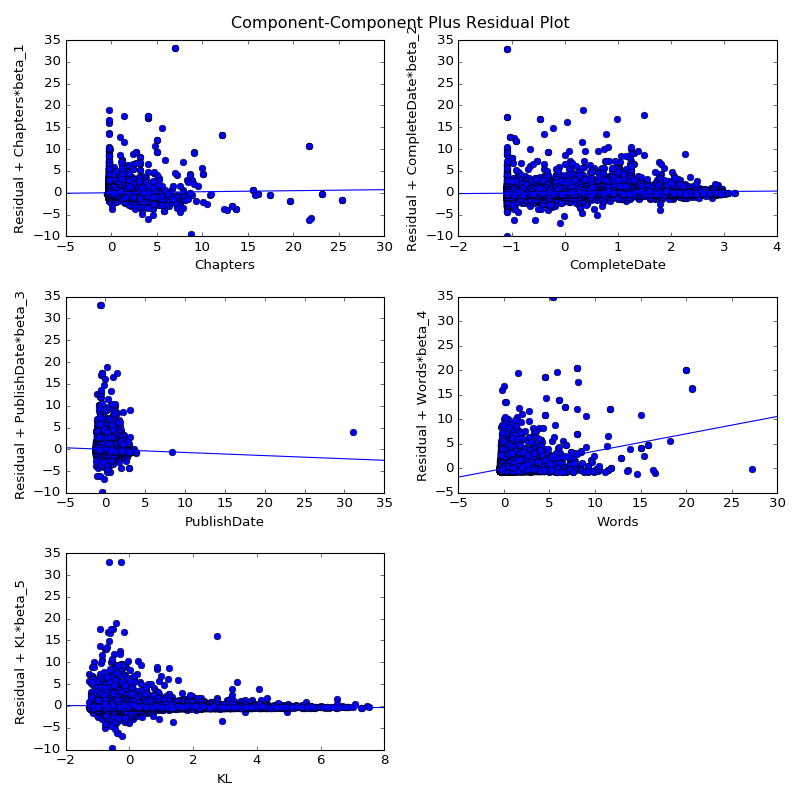

regression for:  naruto_processed2 ， with # of works:  12152


<IPython.core.display.Javascript object>


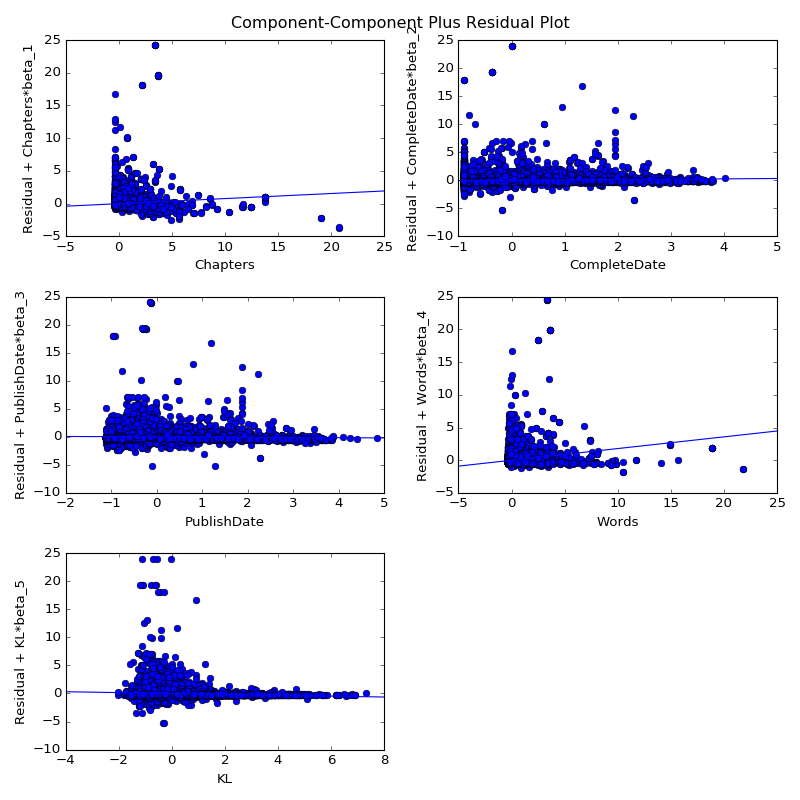

regression for:  one_direction_processed2 ， with # of works:  19820


<IPython.core.display.Javascript object>


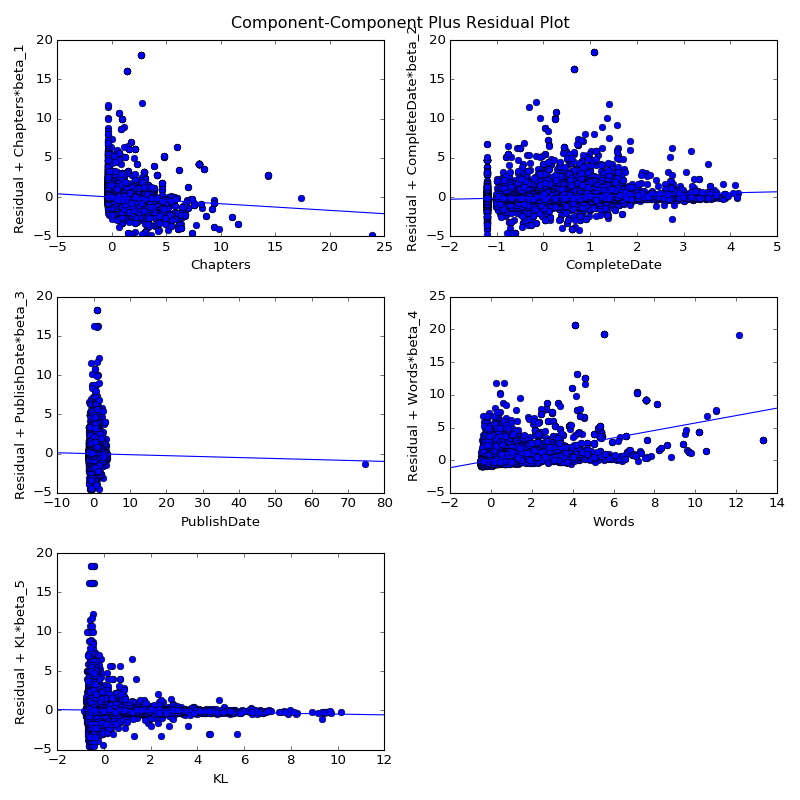

regression for:  original_work_processed2 ， with # of works:  13352


<IPython.core.display.Javascript object>


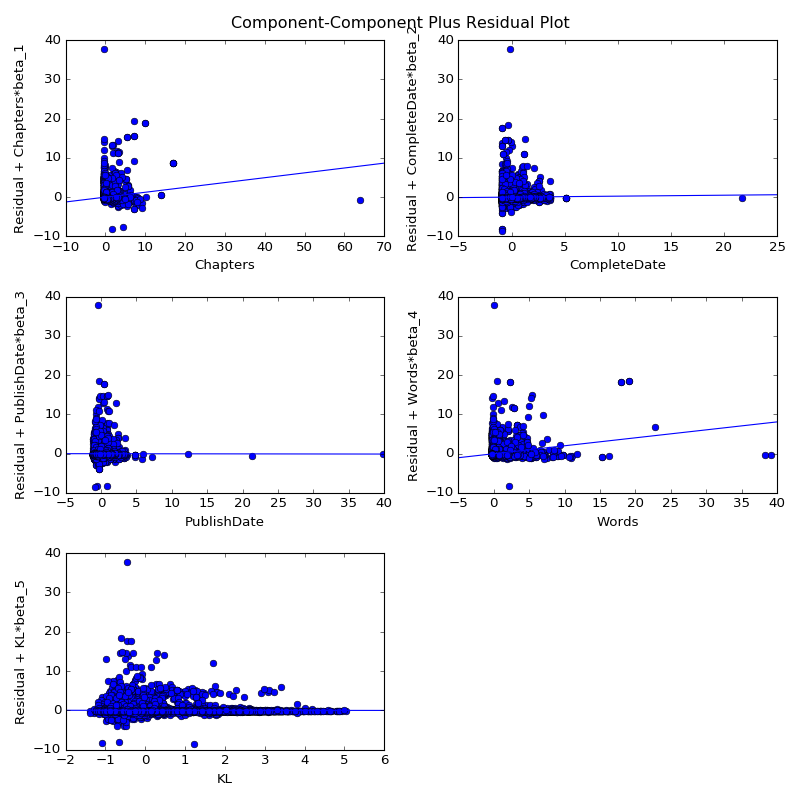

regression for:  rock_music_rpf_processed2 ， with # of works:  20652


<IPython.core.display.Javascript object>


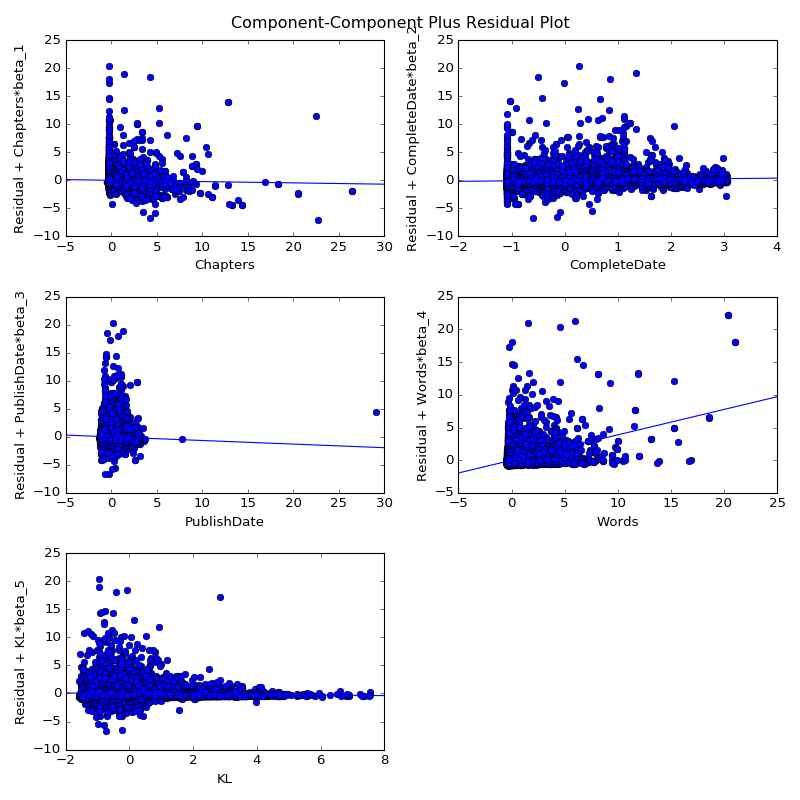

regression for:  shakespare_william_works_processed2 ， with # of works:  1839


<IPython.core.display.Javascript object>


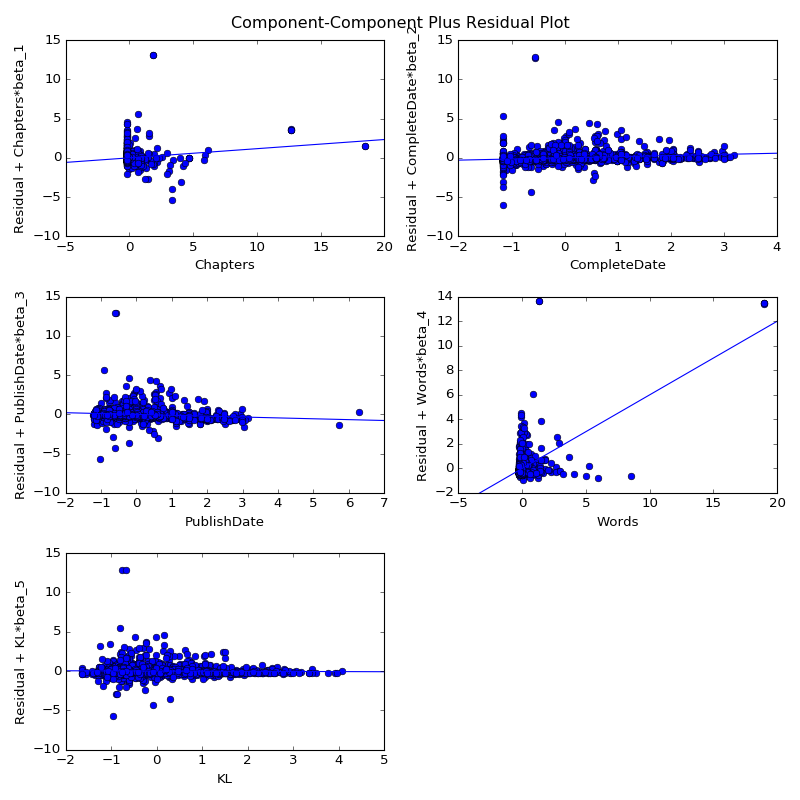

regression for:  sherlock_holmes_&_related_fandoms_processed2 ， with # of works:  78303


<IPython.core.display.Javascript object>


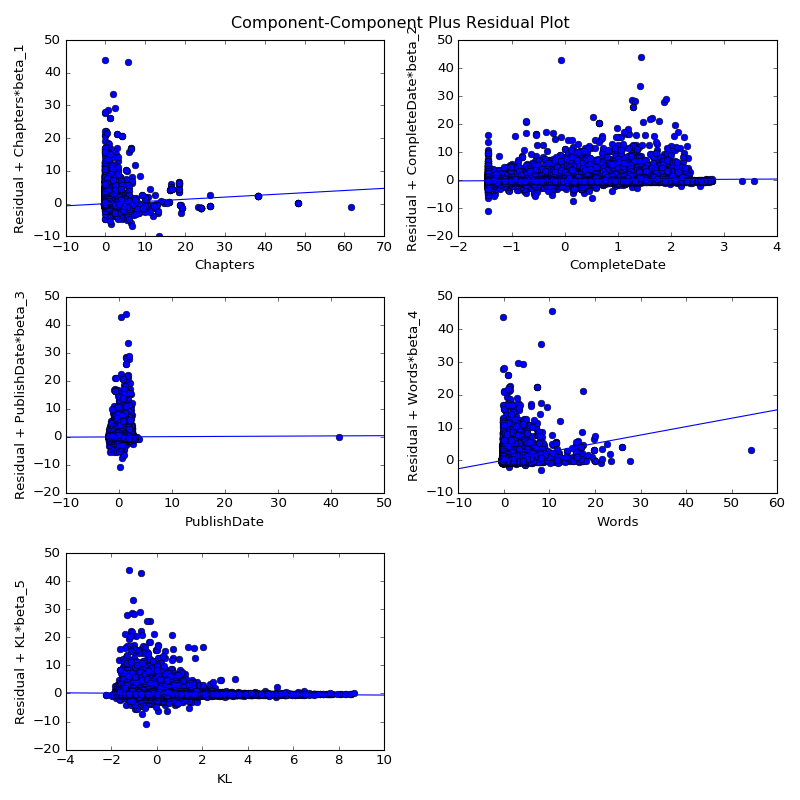

regression for:  star_wars_all_media_types_processed2 ， with # of works:  20905


<IPython.core.display.Javascript object>


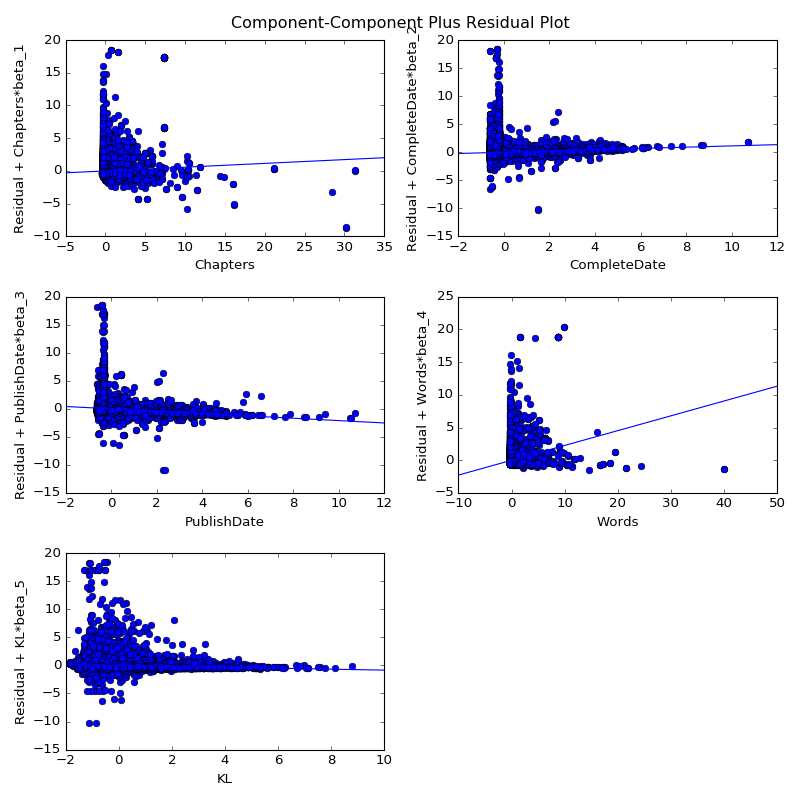

regression for:  the_walking_dead_&_related_fandoms_processed2 ， with # of works:  8692


<IPython.core.display.Javascript object>


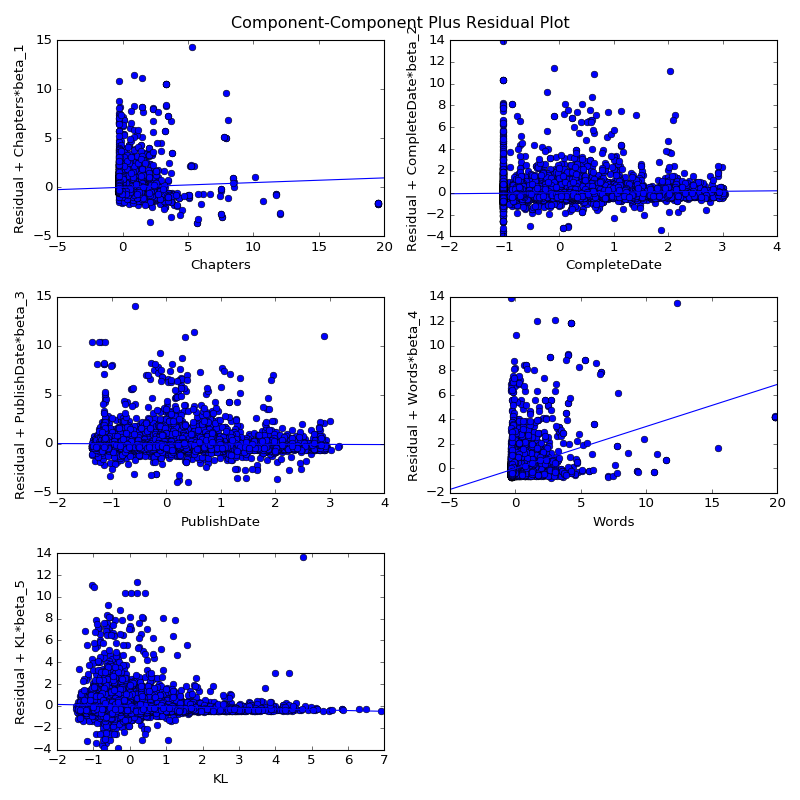

regression for:  tolkien_j_r_r_works_&_related_fandoms_processed2 ， with # of works:  30015


<IPython.core.display.Javascript object>


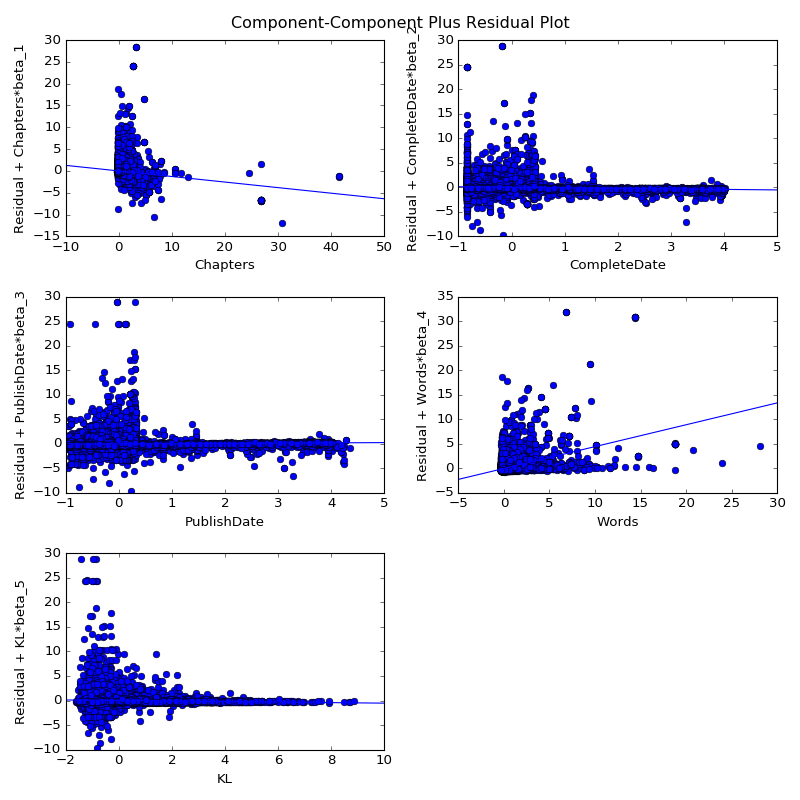

regression for:  video_blogging_rpf_processed2 ， with # of works:  24825


<IPython.core.display.Javascript object>


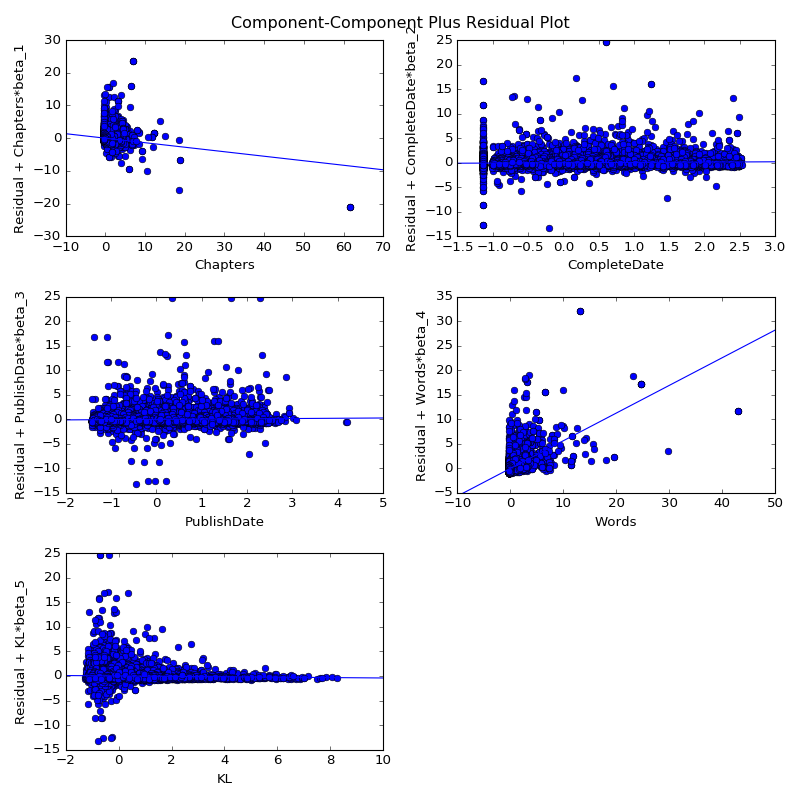

In [62]:
for i in files:
    plot_CCPR_regression2(i)

In [63]:
def plot_summary_regression2(fn):
    df = pd.read_csv(datapath + fn, sep = '\t')
    df = df.drop(df.index[[0, 1]])
    df = df.apply(lambda x: pd.to_numeric(x, errors='ignore'))
    for i in ['Kudos', 'Chapters', 'CompleteDate', 'PublishDate', 'Words', 'KL']:
        df[i] = (df[i].astype(float) - df[i].astype(float).mean())/df[i].astype(float).std(ddof=0)
    m = ols2("Kudos ~ Chapters + CompleteDate + PublishDate + Words + KL", data = df).fit()
    print 'regression for: ', fn.split('.')[0], '， with # of works: ', len(df)
    fig = plt.figure(figsize = (10, 10))
    fig = sm.graphics.plot_regress_exog(m, 'KL', fig=fig)

regression for:  actor_rpf_processed2 ， with # of works:  33244


<IPython.core.display.Javascript object>


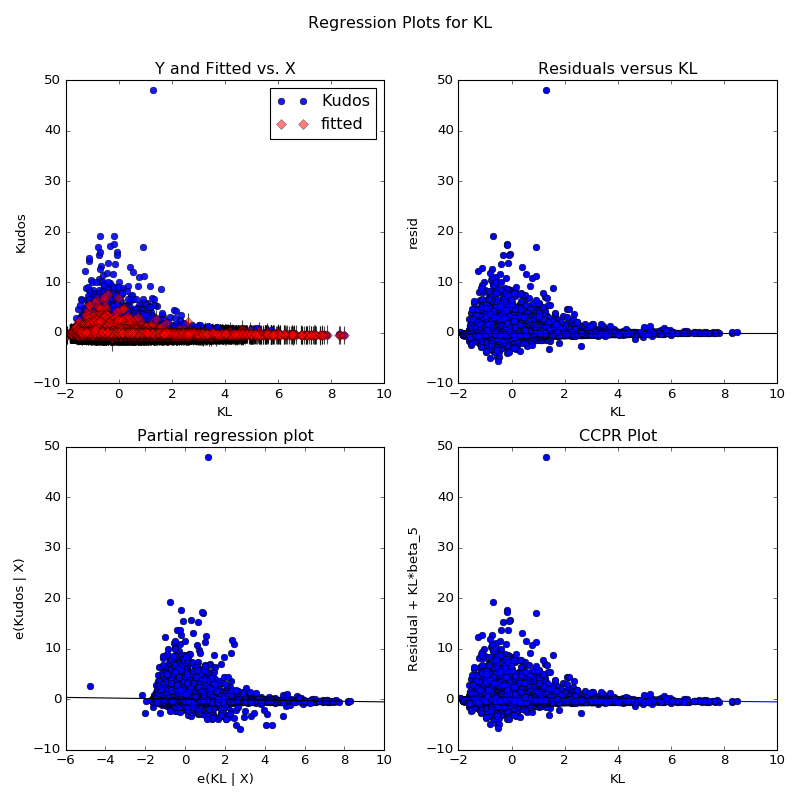

regression for:  arthurian_mythology_&_related_fandoms_processed2 ， with # of works:  22589


<IPython.core.display.Javascript object>


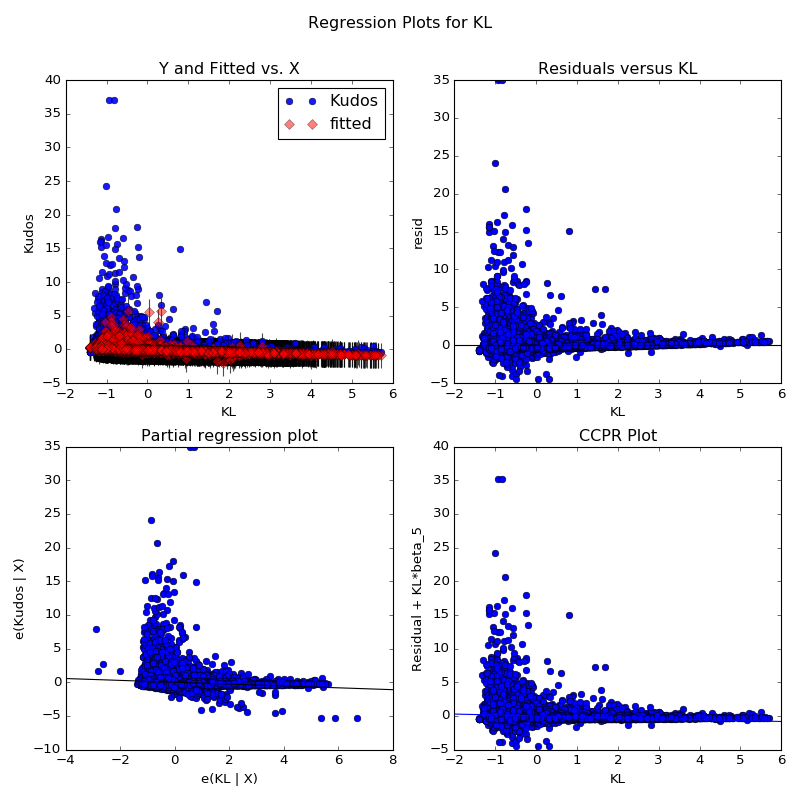

regression for:  attack_on_titan_processed2 ， with # of works:  25255


<IPython.core.display.Javascript object>


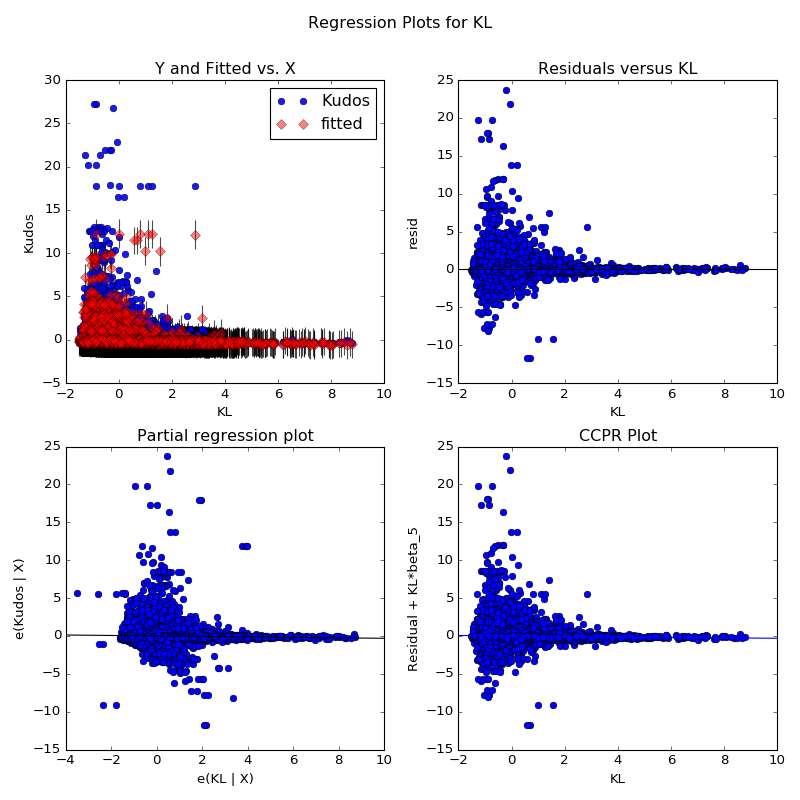

regression for:  bandom_processed2 ， with # of works:  24771


<IPython.core.display.Javascript object>


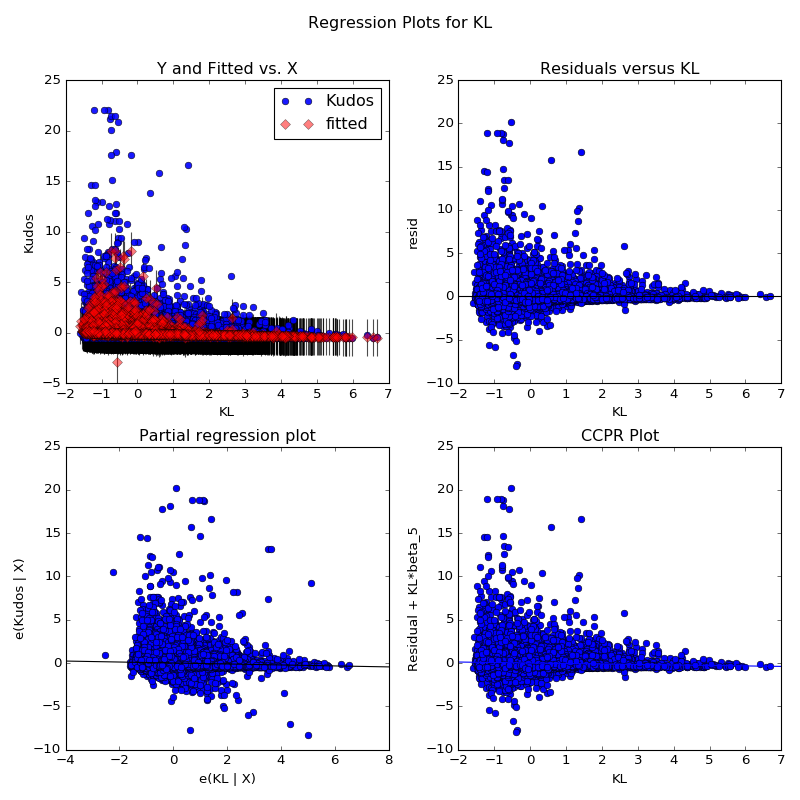

regression for:  bishoujo_senshi_sailor_moon_processed2 ， with # of works:  1992


<IPython.core.display.Javascript object>


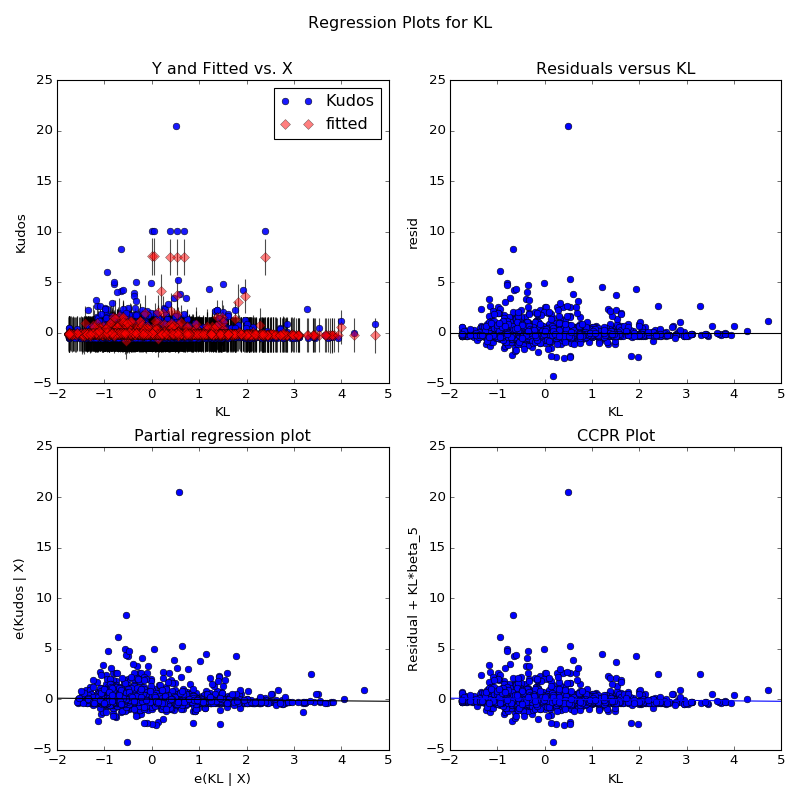

regression for:  buffy_the_vampire_slayer_processed2 ， with # of works:  20809


<IPython.core.display.Javascript object>


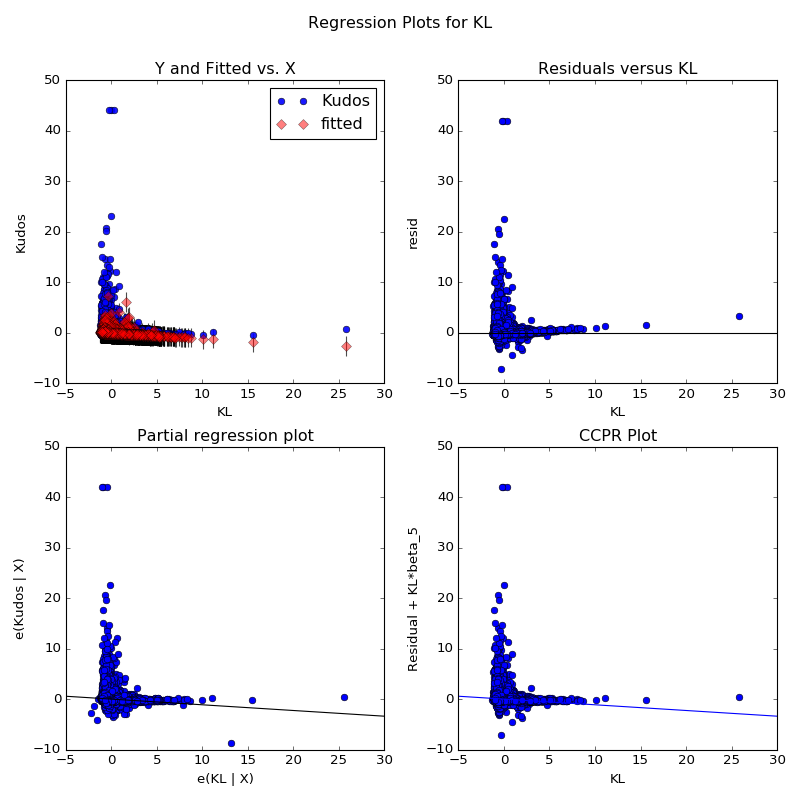

regression for:  dcu_processed2 ， with # of works:  45935


<IPython.core.display.Javascript object>


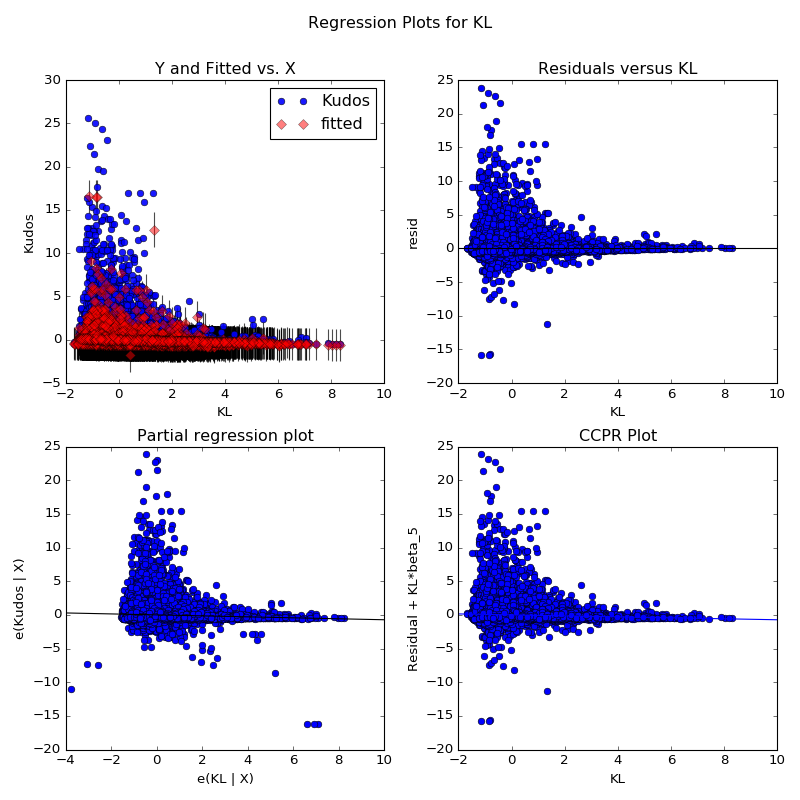

regression for:  doctor_who_&_related_fandoms_processed2 ， with # of works:  42356


<IPython.core.display.Javascript object>


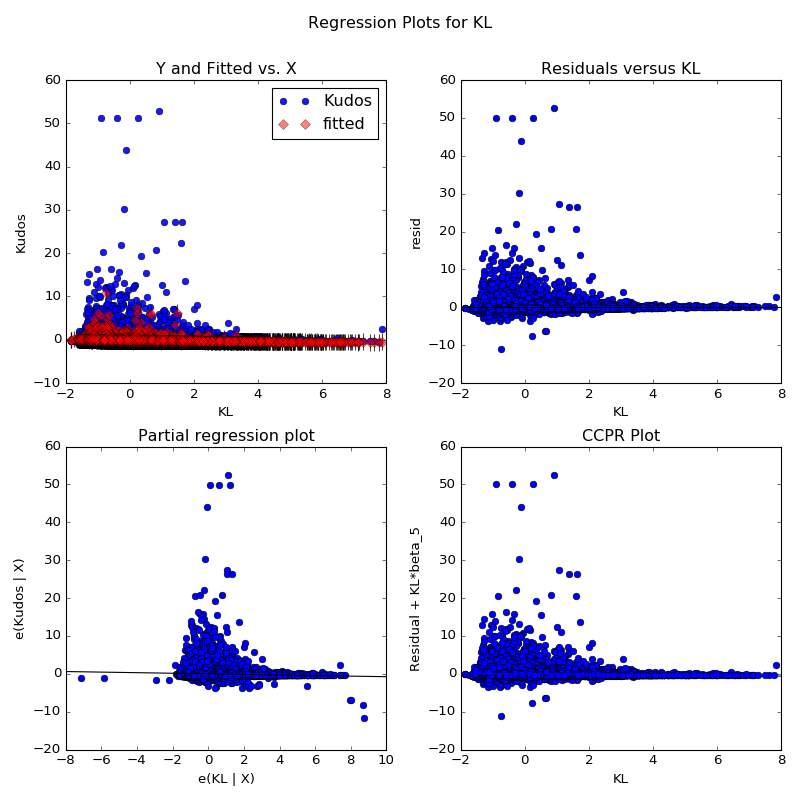

regression for:  doctor_who_processed2 ， with # of works:  33458


<IPython.core.display.Javascript object>


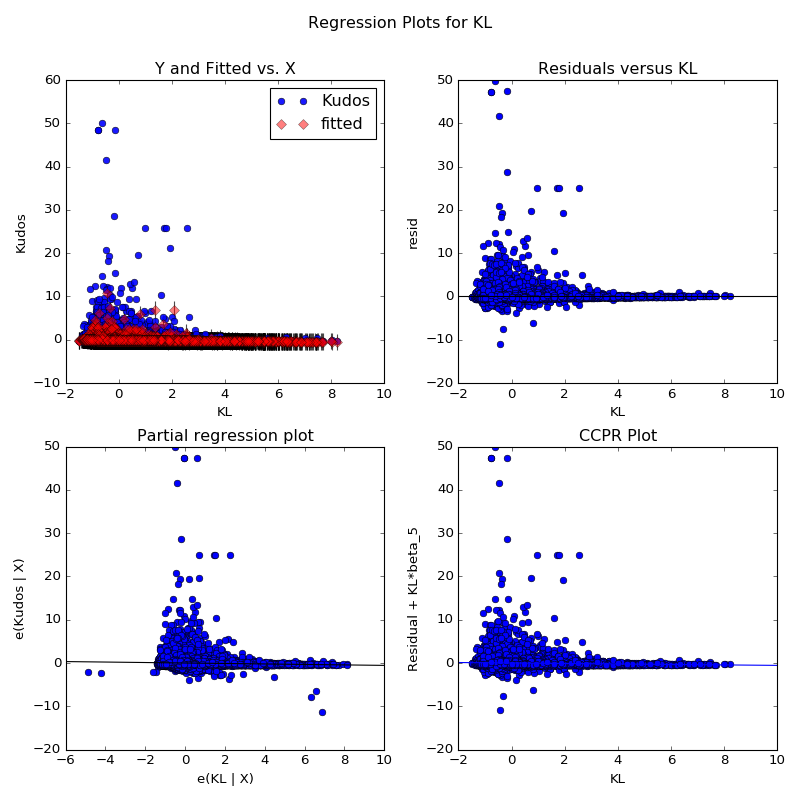

regression for:  dragon_age_all_media_types_processed2 ， with # of works:  34268


<IPython.core.display.Javascript object>


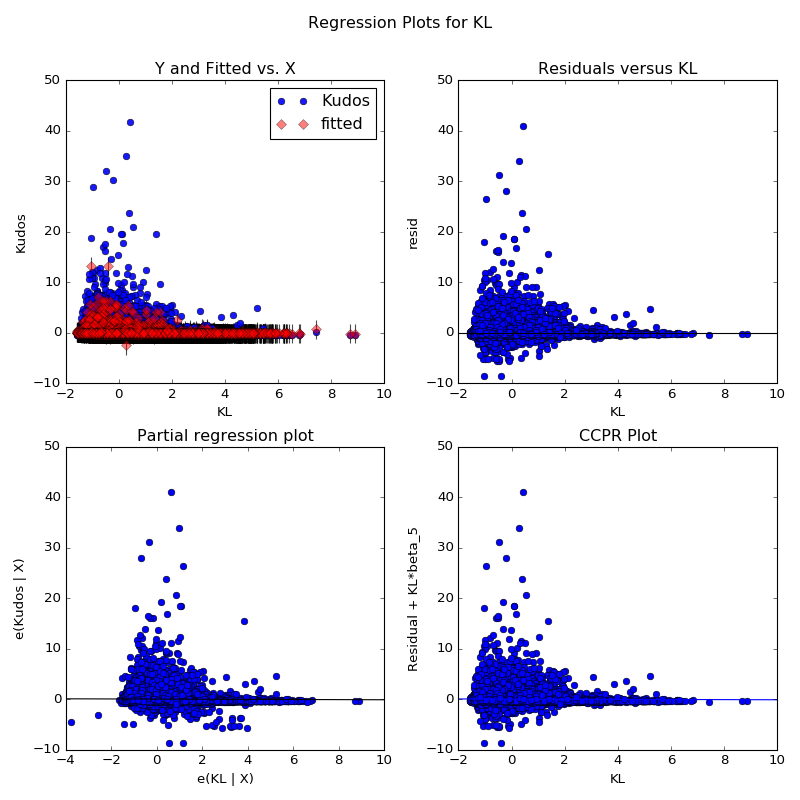

regression for:  dragon_age_inquisition_processed2 ， with # of works:  17954


<IPython.core.display.Javascript object>


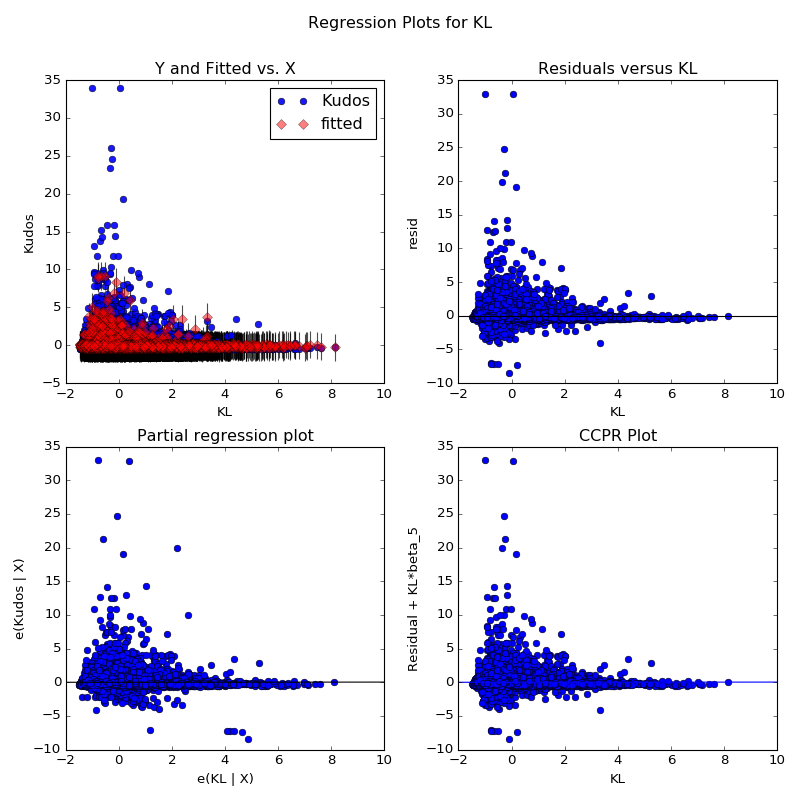

regression for:  dragon_age_video_games_processed2 ， with # of works:  29774


<IPython.core.display.Javascript object>


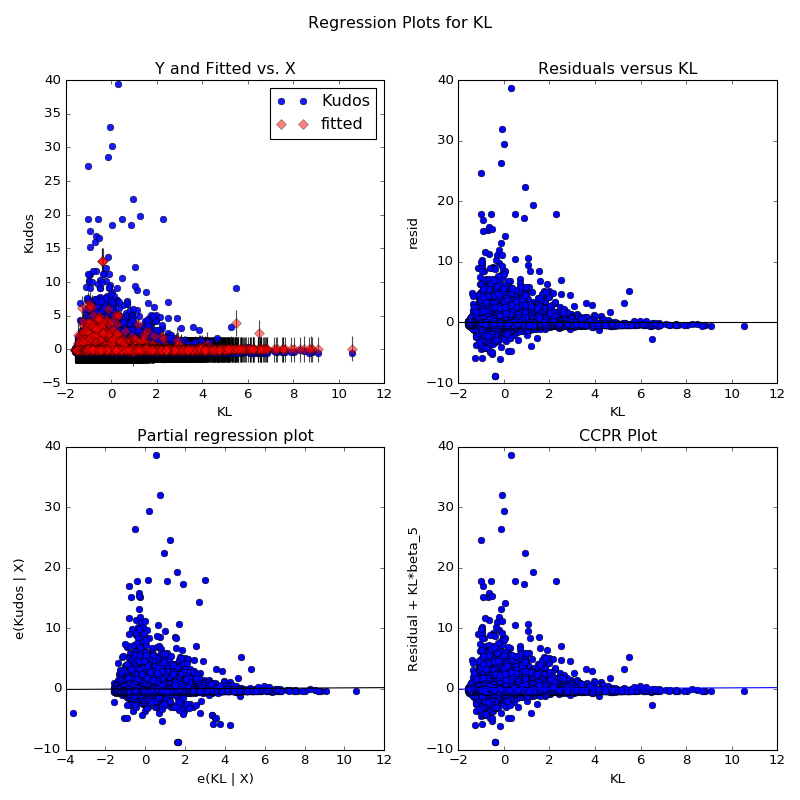

regression for:  haikyuu_processed2 ， with # of works:  18712


<IPython.core.display.Javascript object>


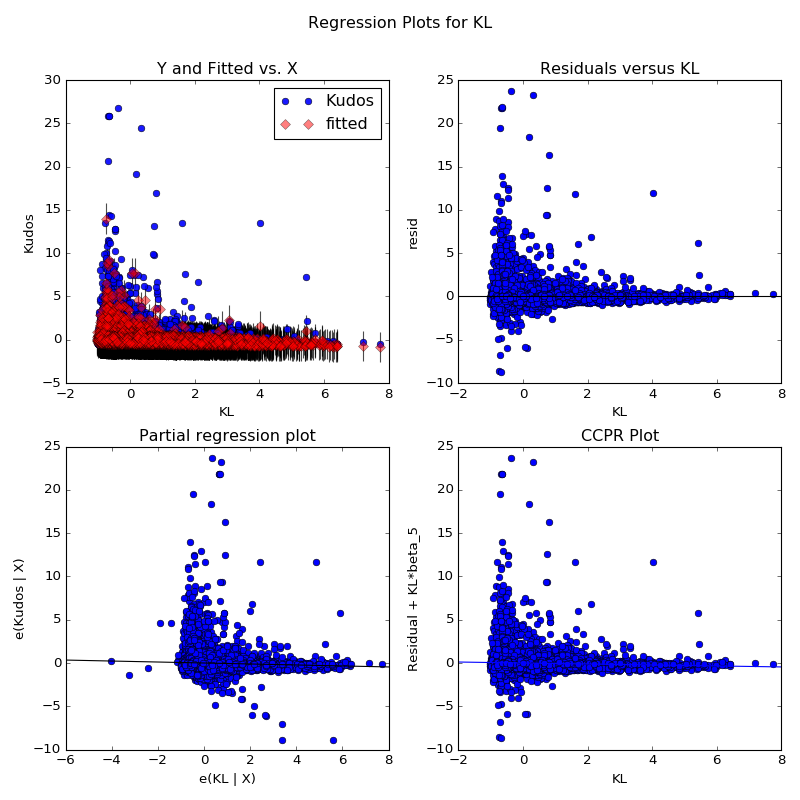

regression for:  hamilton_miranda_processed2 ， with # of works:  2837


<IPython.core.display.Javascript object>


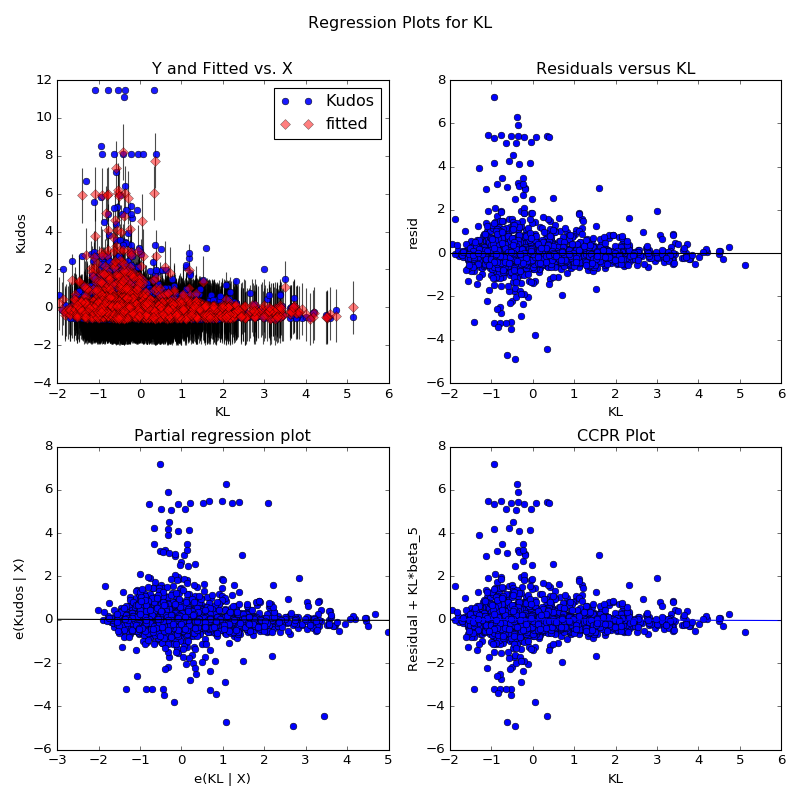

regression for:  hetalia_axis_powers_processed2 ， with # of works:  16373


<IPython.core.display.Javascript object>


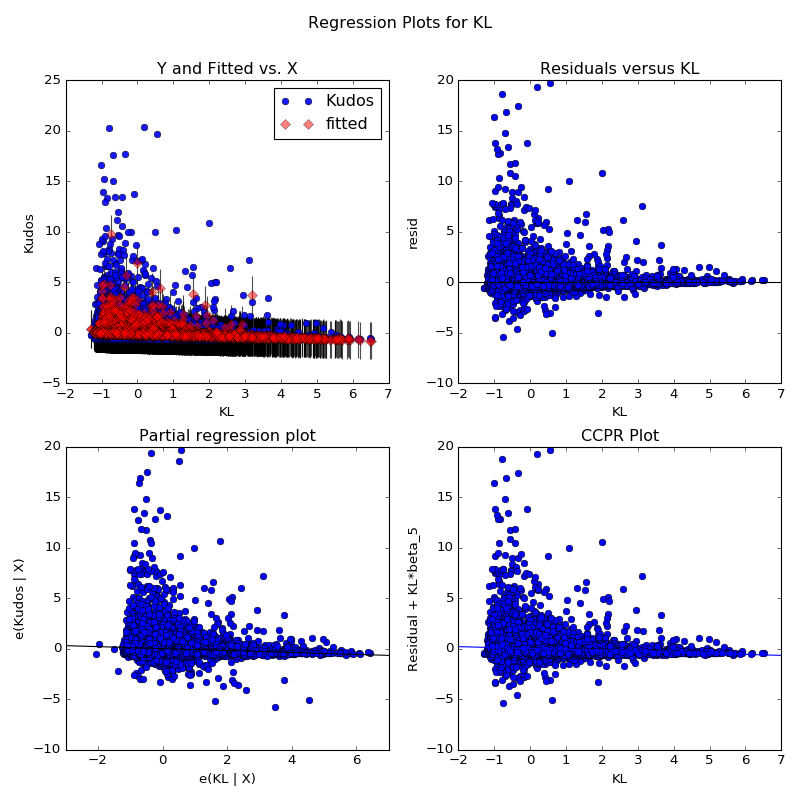

regression for:  homestuck_processed2 ， with # of works:  36649


<IPython.core.display.Javascript object>


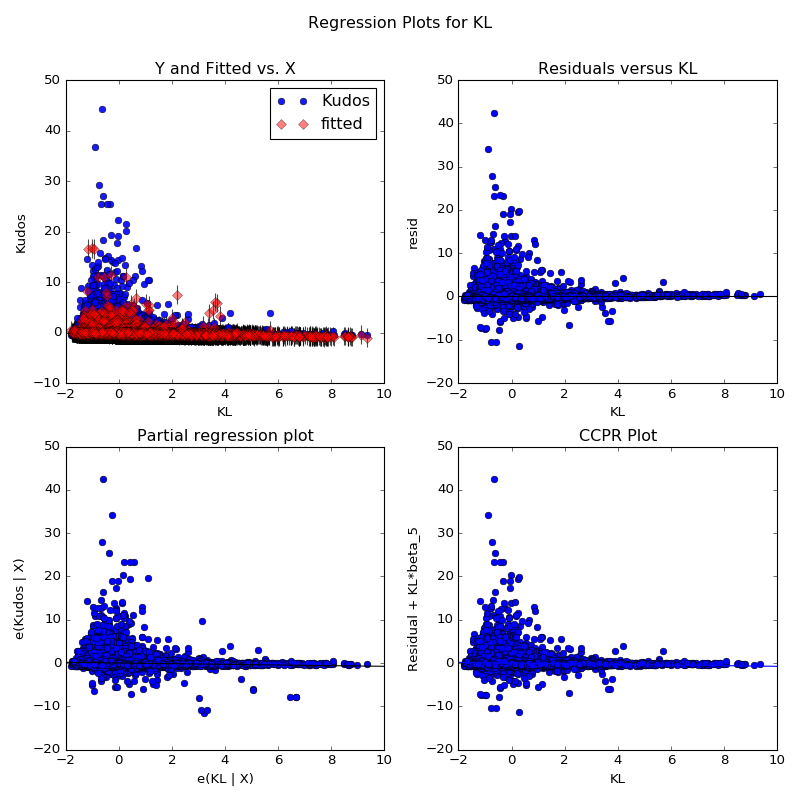

regression for:  internet_personalities_processed2 ， with # of works:  26581


<IPython.core.display.Javascript object>


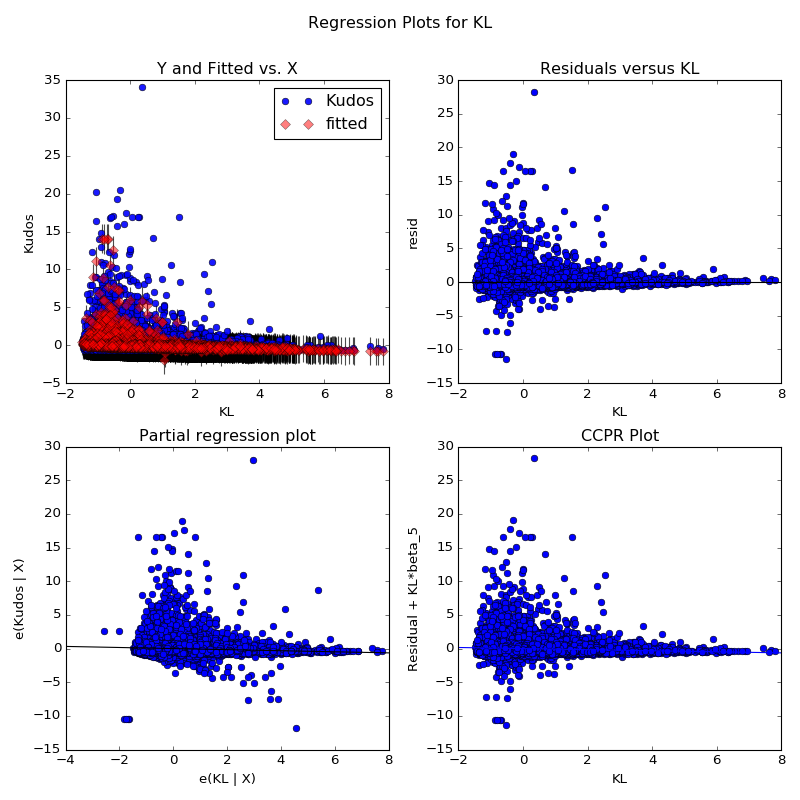

regression for:  k_pop_processed2 ， with # of works:  27353


<IPython.core.display.Javascript object>


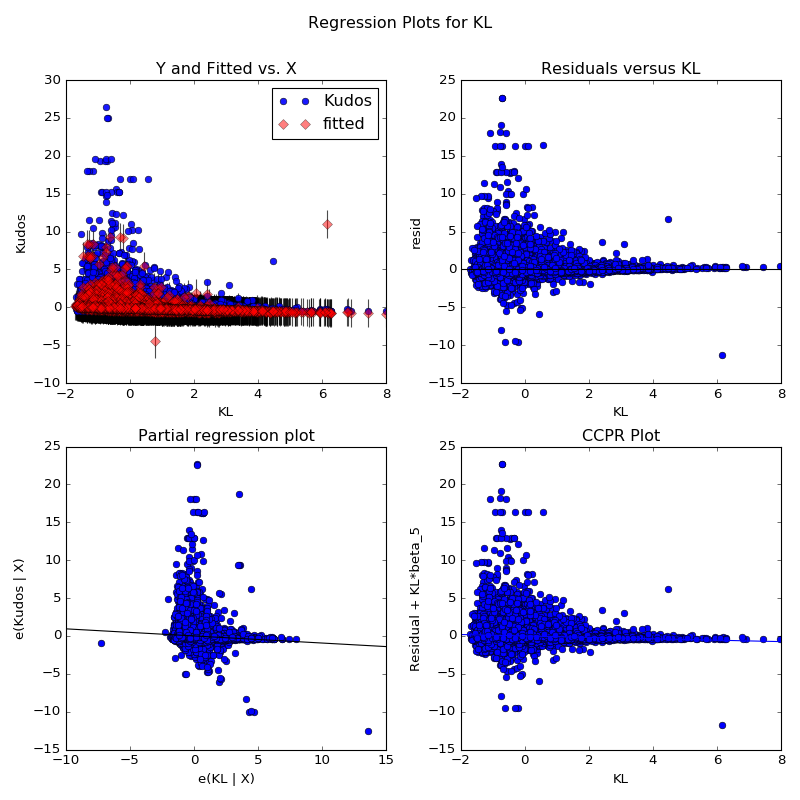

regression for:  kuroko_no_basuke_processed2 ， with # of works:  10679


<IPython.core.display.Javascript object>


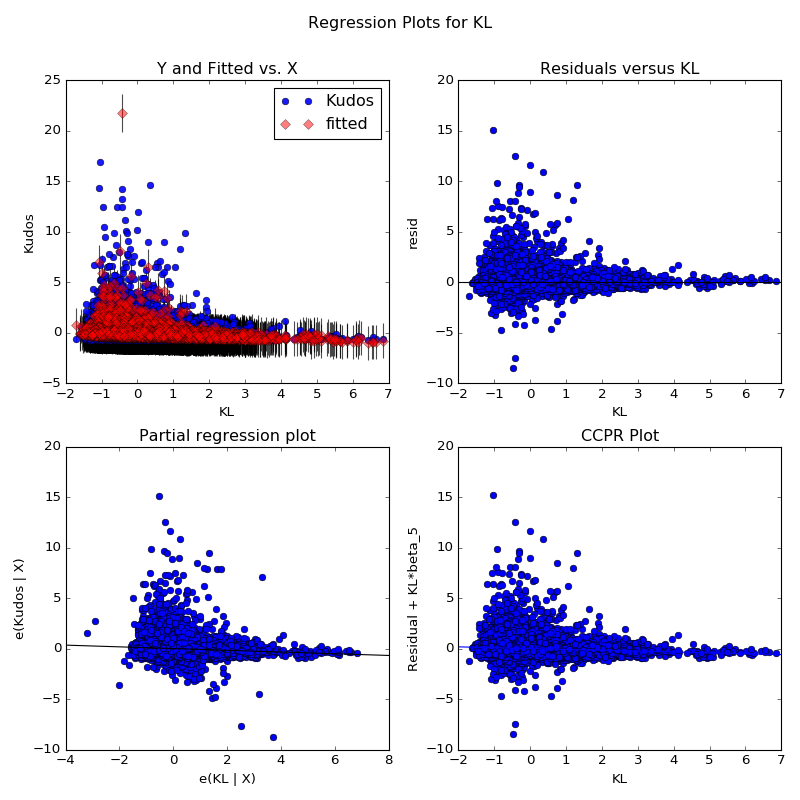

regression for:  les_miserables_all_media_types_processed2 ， with # of works:  13346


<IPython.core.display.Javascript object>


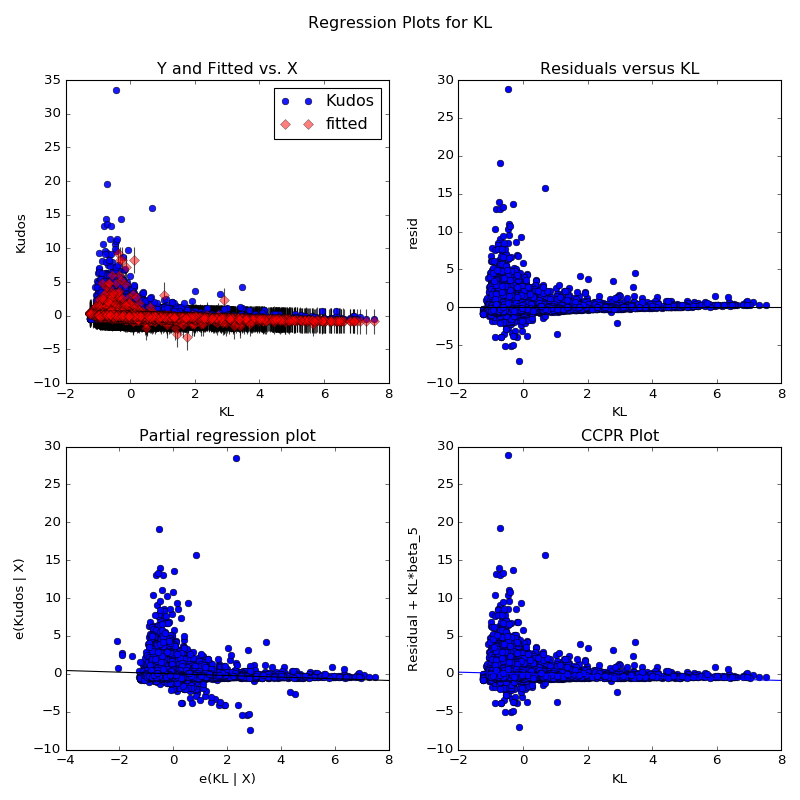

regression for:  les_miserables_schonberg_boublil_processed2 ， with # of works:  2059


<IPython.core.display.Javascript object>


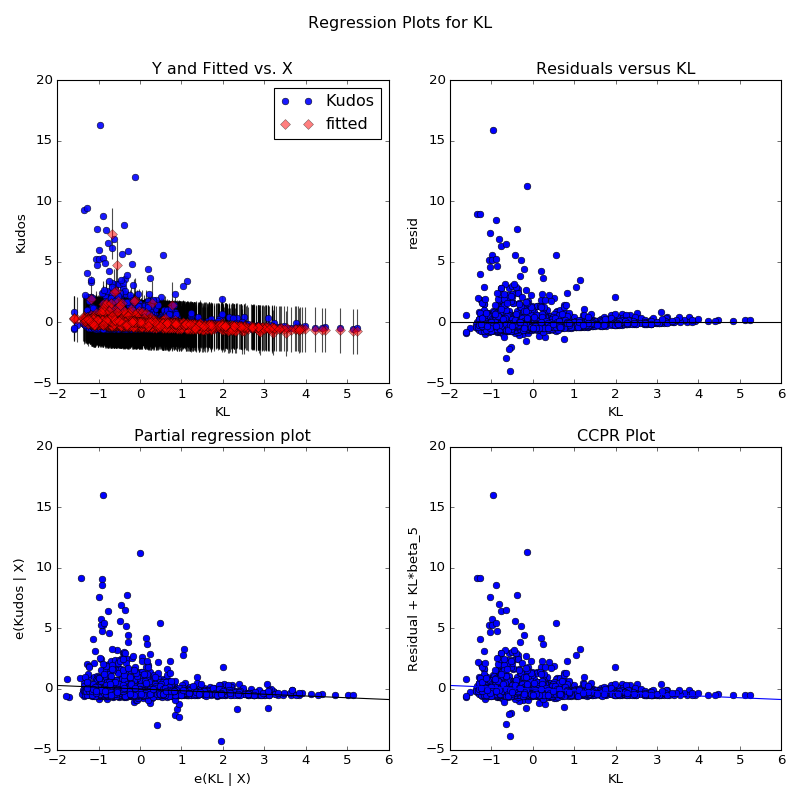

regression for:  ms_paint_adventures_processed2 ， with # of works:  33414


<IPython.core.display.Javascript object>


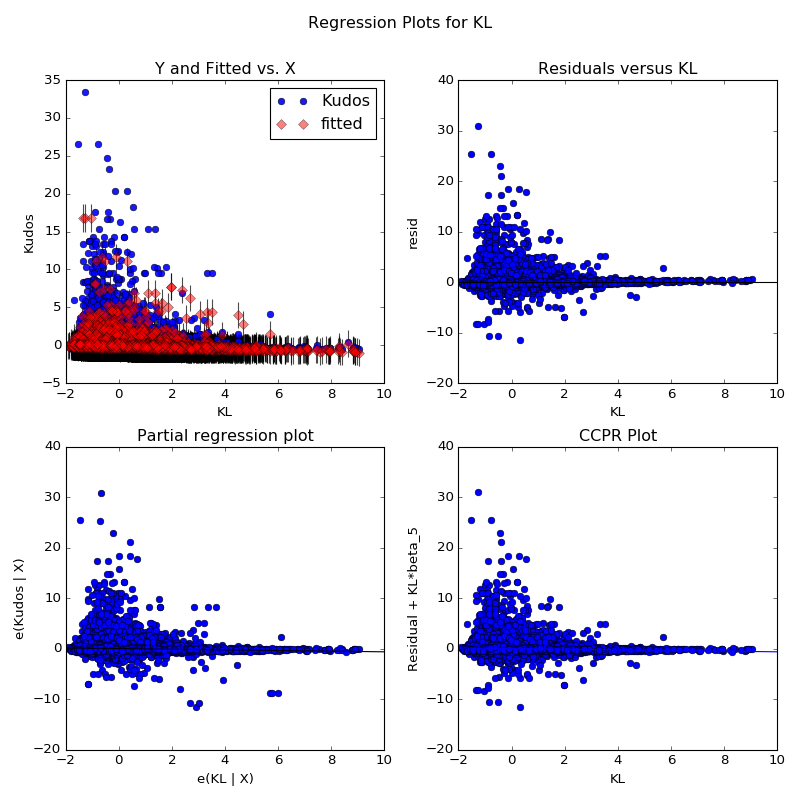

regression for:  music_rpf_processed2 ， with # of works:  24106


<IPython.core.display.Javascript object>


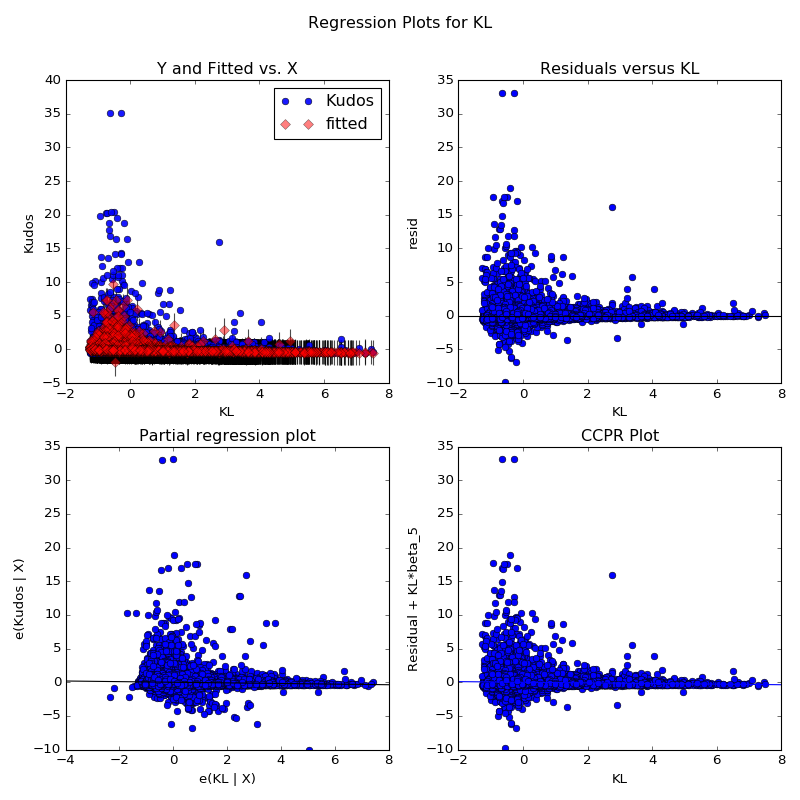

regression for:  naruto_processed2 ， with # of works:  12152


<IPython.core.display.Javascript object>


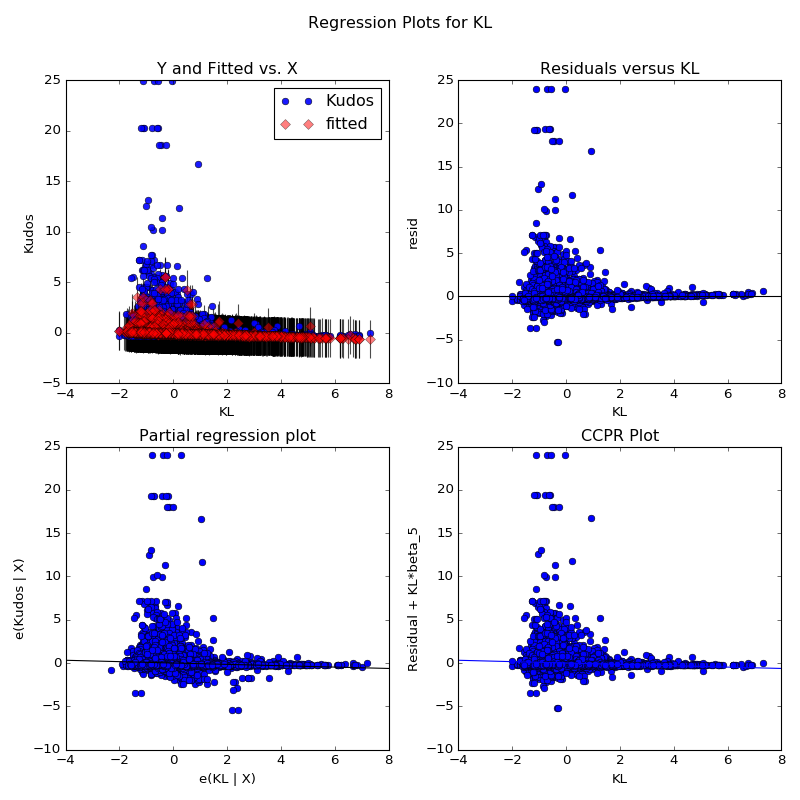

regression for:  one_direction_processed2 ， with # of works:  19820


<IPython.core.display.Javascript object>


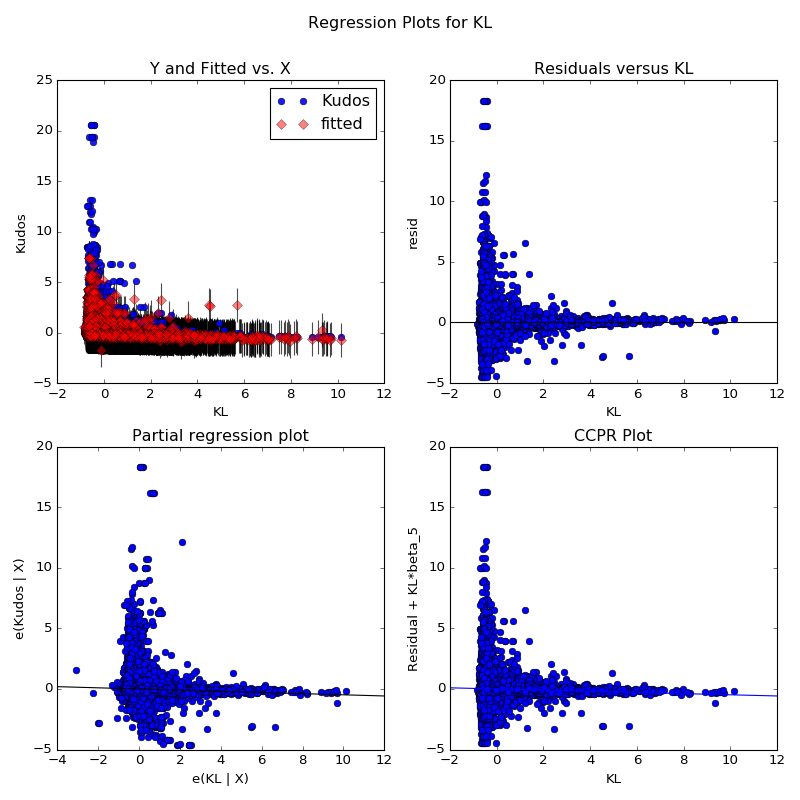

regression for:  original_work_processed2 ， with # of works:  13352


<IPython.core.display.Javascript object>


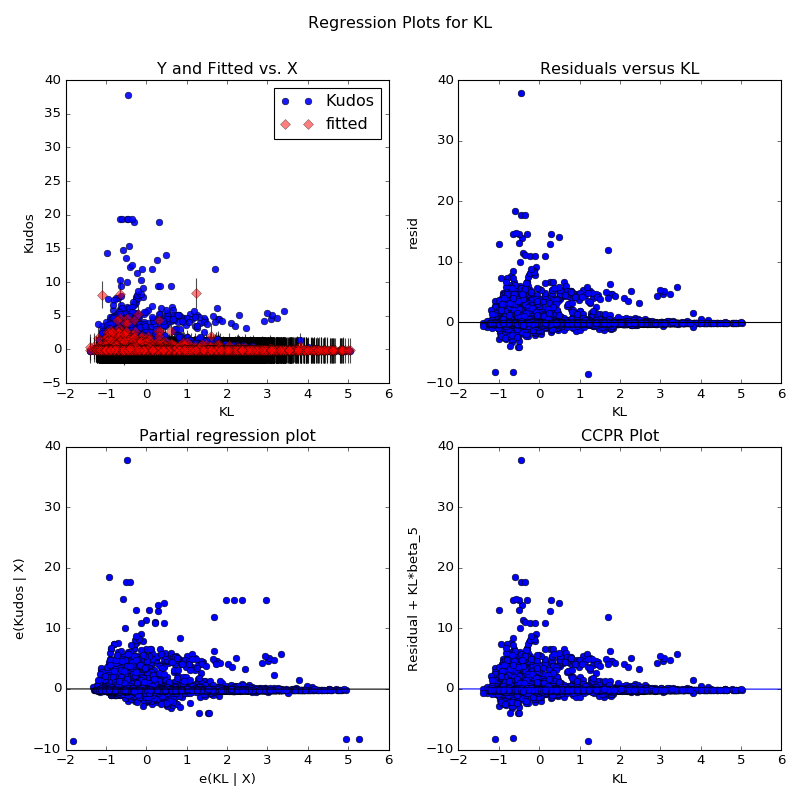

regression for:  rock_music_rpf_processed2 ， with # of works:  20652


<IPython.core.display.Javascript object>


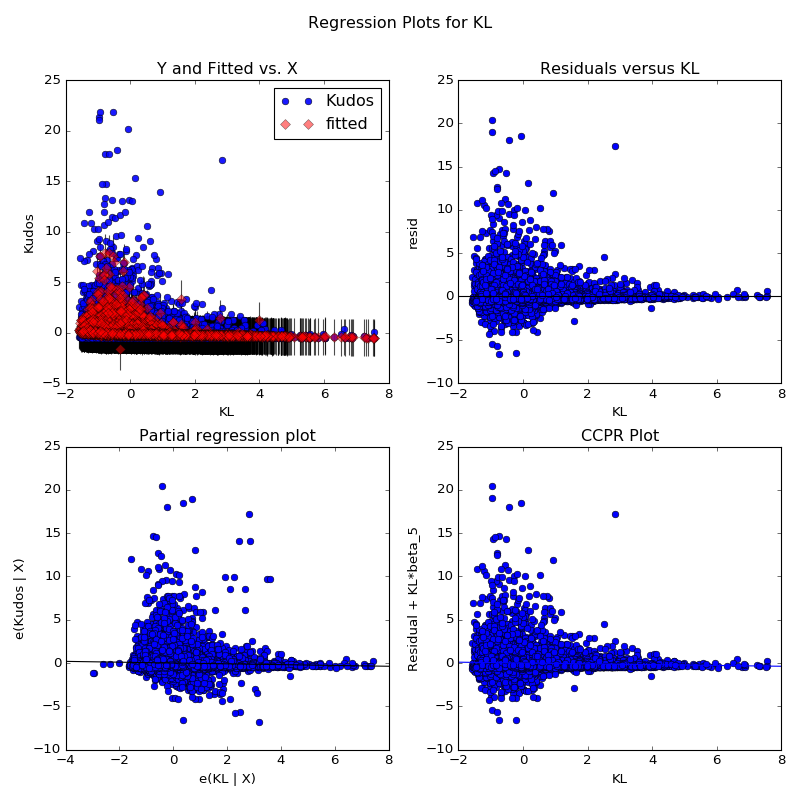

regression for:  shakespare_william_works_processed2 ， with # of works:  1839


<IPython.core.display.Javascript object>


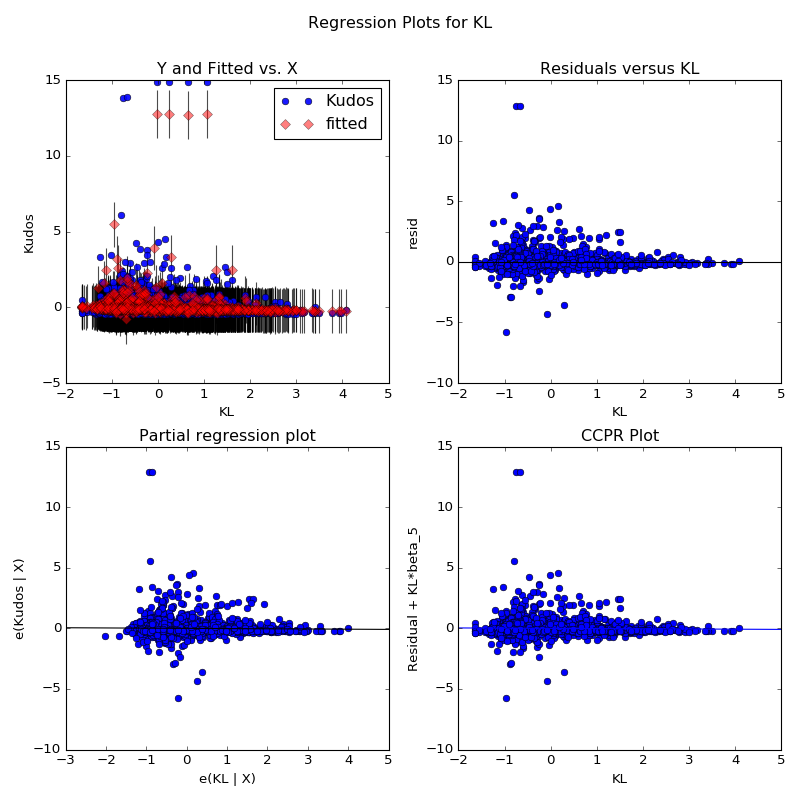

regression for:  sherlock_holmes_&_related_fandoms_processed2 ， with # of works:  78303


<IPython.core.display.Javascript object>


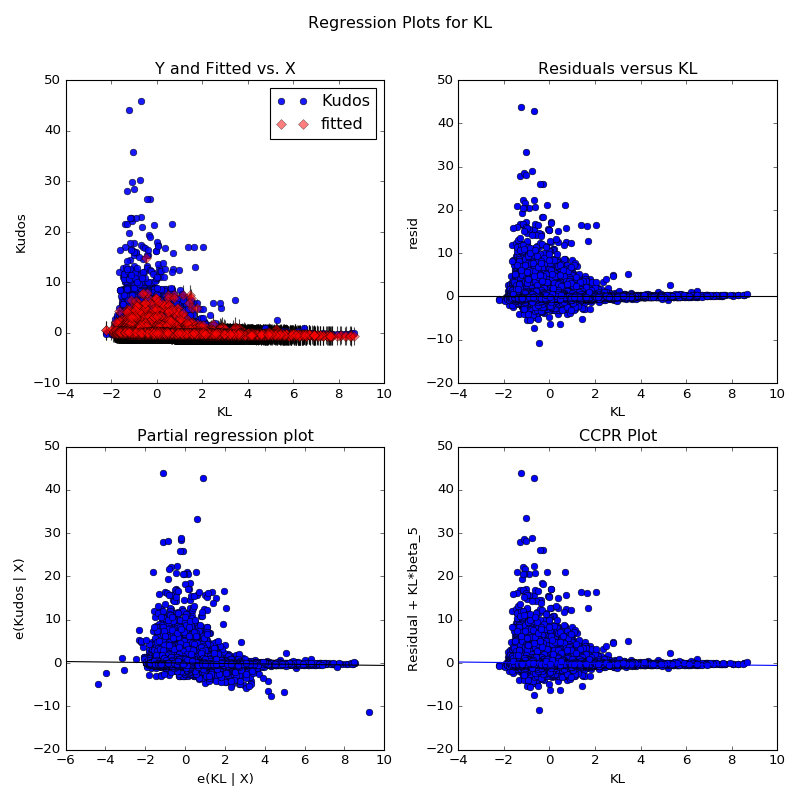

regression for:  star_wars_all_media_types_processed2 ， with # of works:  20905


<IPython.core.display.Javascript object>


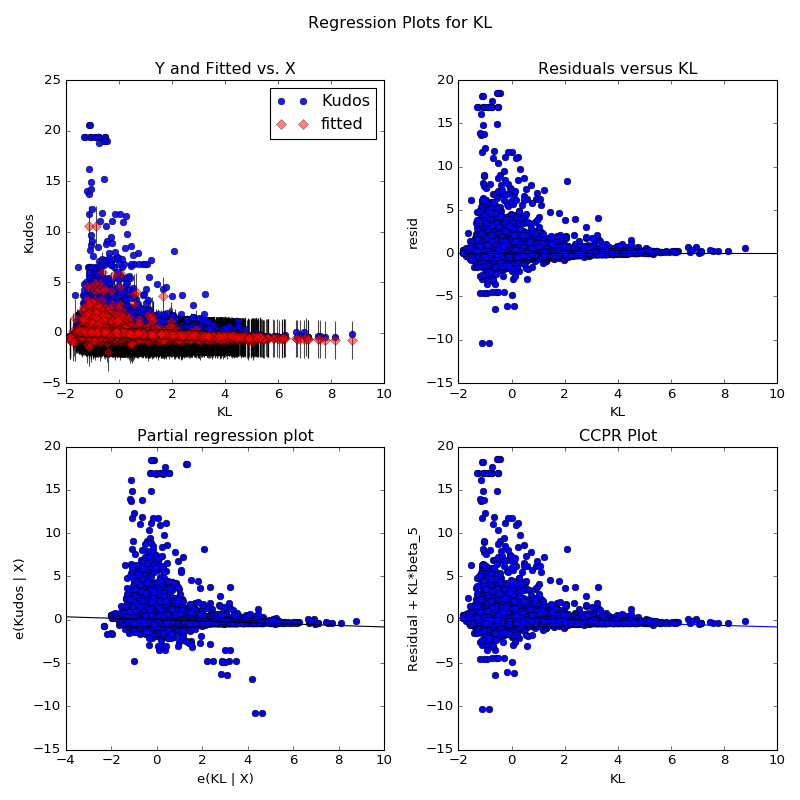

regression for:  the_walking_dead_&_related_fandoms_processed2 ， with # of works:  8692


<IPython.core.display.Javascript object>


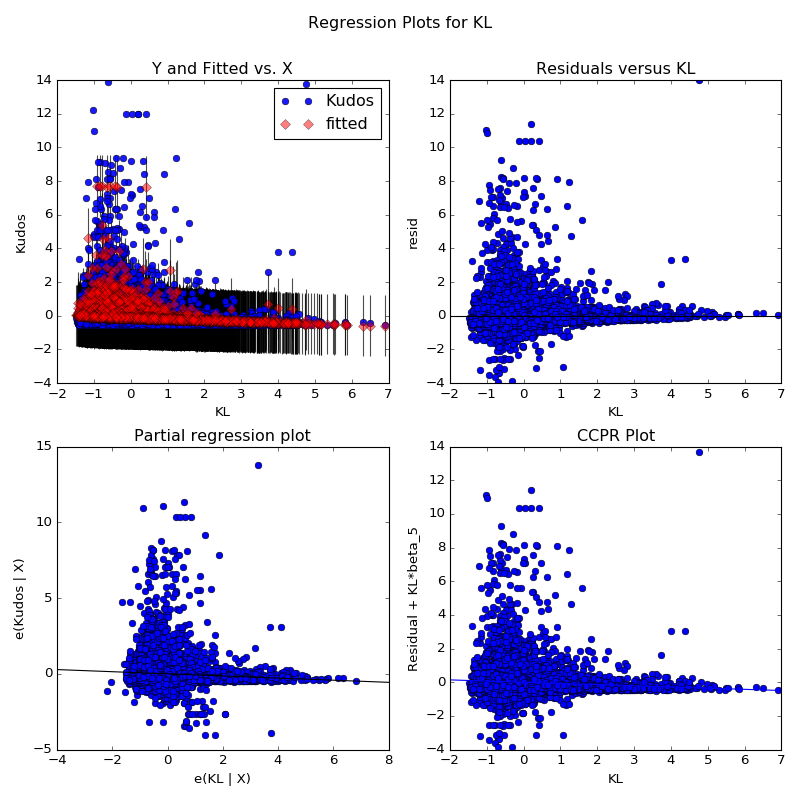

regression for:  tolkien_j_r_r_works_&_related_fandoms_processed2 ， with # of works:  30015


<IPython.core.display.Javascript object>


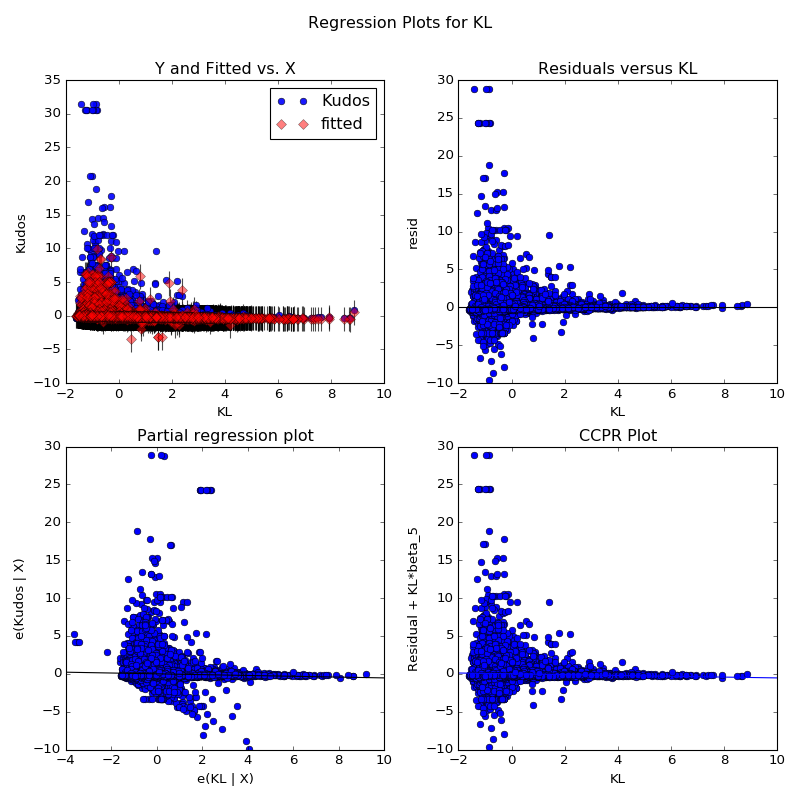

regression for:  video_blogging_rpf_processed2 ， with # of works:  24825


<IPython.core.display.Javascript object>


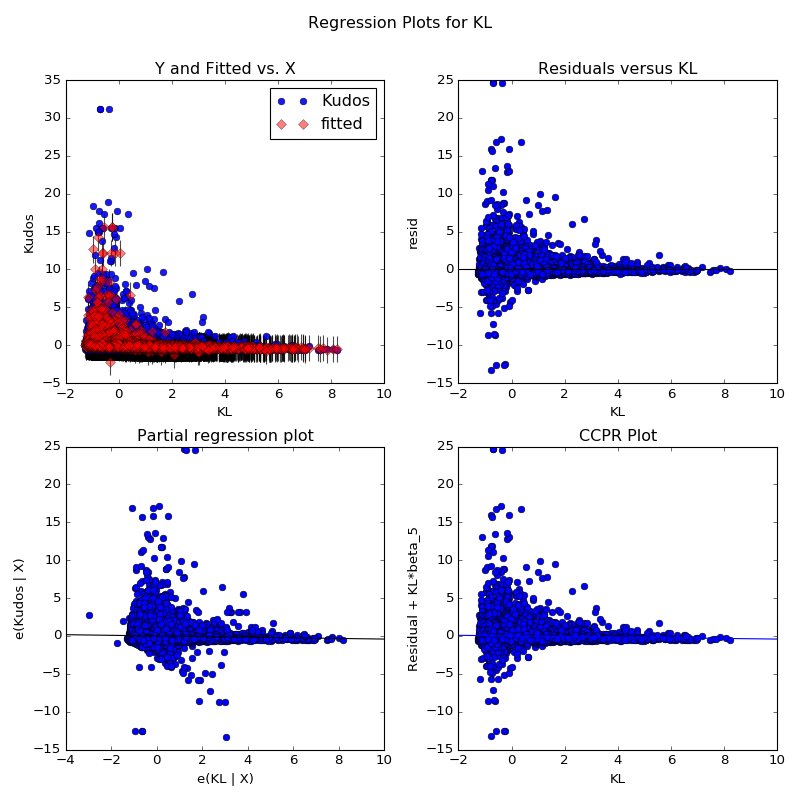

In [64]:
for i in files:
    plot_summary_regression2(i)